In [3]:
from pykalman import KalmanFilter
import pandas as pd
import numpy as np
import schedule
import os
import math
import matplotlib.pyplot as plt
import json
from shapely.geometry import Point, Polygon
import plotly.express as px
from geopy import Nominatim
from pygeocoder import Geocoder
import time
from sklearn.cluster import KMeans
geolocator = Nominatim(user_agent='Pechino.ipynb')

In [2]:
from matplotlib.ticker import LogFormatter 
class LogFormatterHB(LogFormatter):
     def call(self, v, pos=None):
         vv = self._base ** v
         return LogFormatter.__call__(self, vv, pos) 

In [3]:
full_files = ('./../data-set/Pechino/all.csv')          # All folders: 700 MB

print ("Reading in the .txt files...")
data = pd.read_csv(full_files)

print ("Size of data frame: ", data.shape)



Reading in the .txt files...
Size of data frame:  (1033347, 4)


In [4]:
#load weeks data
data2=pd.read_csv('./../data-set/Pechino/WEEK/2008-02-02.csv')
data3=pd.read_csv('./../data-set/Pechino/WEEK/2008-02-03.csv')
data4=pd.read_csv('./../data-set/Pechino/WEEK/2008-02-04.csv')
data5=pd.read_csv('./../data-set/Pechino/WEEK/2008-02-05.csv')
data6=pd.read_csv('./../data-set/Pechino/WEEK/2008-02-06.csv')
data7=pd.read_csv('./../data-set/Pechino/WEEK/2008-02-07.csv')
data8=pd.read_csv('./../data-set/Pechino/WEEK/2008-02-08.csv')

data2 = data2.drop(data2[data2.latitude == 0.0].index)
data3 = data3.drop(data3[data3.latitude == 0.0].index)
data4 = data4.drop(data4[data4.latitude == 0.0].index)
data5 = data5.drop(data5[data5.latitude == 0.0].index)
data6 = data6.drop(data6[data6.latitude == 0.0].index)
data7 = data7.drop(data7[data7.latitude == 0.0].index)
data8 = data8.drop(data8[data8.latitude == 0.0].index)



In [5]:
from math import radians, cos, sin, asin, sqrt
def measure(lat1, lon1, lat2, lon2) :
    
    R = 6372.8 

    dLat = radians(lat2 - lat1)
    dLon = radians(lon2 - lon1)
    lat1 = radians(lat1)
    lat2 = radians(lat2)

    a = sin(dLat/2)**2 + cos(lat1)*cos(lat2)*sin(dLon/2)**2
    c = 2*asin(sqrt(a))

    return R * c

In [6]:
latlon2=data2[['taxi_id','longitude','latitude']].to_numpy()

In [7]:
latlon2.size/3

95783.0

In [8]:
interval = range(0,int(latlon2.size/3))
lista2 = list (interval) 
i = 0
id= latlon2[i][0]
while i<(latlon2.size)/3 -1 :
    if(id!=latlon2[i+1][0]):
        lista2[i]='end'
        id=latlon2[i+1][0]
    else:
        lista2[i] =(measure(latlon2[i][2],latlon2[i][1],latlon2[i+1][2],latlon2[i+1][1])*1000)
    i=i+1

In [9]:
lista2[int(latlon2.size/3)-1]=0

In [10]:
data2['Distances_m']=lista2

In [11]:
import datetime
from datetime import timedelta
from datetime import datetime

def timeSet(datetime1,datetime2):
    fmt = '%Y-%m-%d %H:%M:%S'
    tstamp1 = datetime.strptime(datetime1, fmt)
    tstamp2 = datetime.strptime(datetime2, fmt)

    if tstamp1 > tstamp2:
        td = tstamp1 - tstamp2
    else:
        td = tstamp2 - tstamp1
    return td.total_seconds()

In [12]:
new2 = data2[['taxi_id','date_time']].to_numpy()

In [13]:
intervaltime=range(0,int(new2.size/2))
timex2=list(intervaltime)
i = 0
id=new2[i][0]
while i<(new2.size/2)-1:
    if(id!=new2[i+1][0]):
        timex2[i]='end'
        id=new2[i+1][0]
    elif(timeSet(new2[i][1],new2[i+1][1]) > 3600.0):
        timex2[i]="sosta"
    else:
        timex2[i]= timeSet(new2[i][1],new2[i+1][1])
    i=i+1;

In [14]:
timex2[int(new2.size/2)-1]=1 # not 0 because i've to do the division

In [15]:
data2['IntervalRecordTime_s'] = timex2

In [16]:
def measure_speed(lista,timex):
    intervalSpeed=range(0,len(timex)) #lista and timex have same lenght
    speedList= list(intervalSpeed)
    i=0
    while i < (len(timex))-1:
        if(timex[i] == "sosta" or timex[i]=="end" or lista[i]=="end" or timex[i]==0):
            speedList[i] = 0.0
        elif((lista[i]/(timex[i]))*3.6 > 150.0):
            speedList[i]="assurdo"
        else:
            speedList[i] = (lista[i]/(timex[i]))*3.6 #in k/h
        i=i+1
    speedList[len(timex)-1]=0    
    return speedList

In [17]:
intervalSpeed=range(0,len(timex2)) #lista and timex have same lenght
speedList2= list(intervalSpeed)
speedList2=measure_speed(lista2,timex2)

In [18]:
data2['speed_km'] = speedList2
data2 = data2.drop(data2[data2.speed_km == "assurdo"].index)

In [19]:
import skmob
from skmob import TrajDataFrame
trajecory2 = skmob.TrajDataFrame(data2, latitude='latitude', longitude = 'longitude',user_id='taxi_id',datetime='date_time')

/home/marco/.local/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [20]:
# compute the home location for each individual
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location
hl_df2 = home_location(trajecory2)
print(hl_df2.head())

100%|██████████| 572/572 [00:02<00:00, 273.18it/s]

   uid       lat        lng
0   21  39.76046  116.82484
1   31  39.93947  116.42803
2   42  39.93239  116.45302
3   57  39.89355  116.25563
4   66  39.94000  116.42831


In [21]:
# now let's visualize a cloropleth map of the home locations 
import folium
from folium.plugins import HeatMap
m = folium.Map(tiles = 'openstreetmap', zoom_start=12, control_scale=True)
HeatMap(hl_df2[['lat', 'lng']].values).add_to(m)
m

In [19]:
#starting day 2
latlon3=data3[['taxi_id','longitude','latitude']].to_numpy()

In [20]:
def distances(latlon):
    interval = range(0,int(latlon.size/3))
    lista = list (interval) 
    i = 0
    id= latlon[i][0]
    while i<(latlon.size)/3 -1 :
        if(id!=latlon[i+1][0]):
            lista[i]='end'
            id=latlon[i+1][0]
        else:
            lista[i] =(measure(latlon[i][2],latlon[i][1],latlon[i+1][2],latlon[i+1][1])*1000)
        i=i+1
    return lista

In [21]:
interval = range(0,int(latlon3.size/3))
lista3 = list (interval)
lista3 = distances(latlon3)

In [22]:
lista3[int(latlon3.size/3)-1]=0

In [23]:
data3['Distances_m']=lista3

In [24]:
new3 = data3[['taxi_id','date_time']].to_numpy()

In [25]:
def ctime(new):
    intervaltime=range(0,int(new.size/2))
    timex=list(intervaltime)
    i = 0
    id=new[i][0]
    while i<(new.size/2)-1:
        if(id!=new[i+1][0]):
            timex[i]='end'
            id=new[i+1][0]
        elif(timeSet(new[i][1],new[i+1][1]) > 1200.0):
            timex[i]="sosta"
        else:
            timex[i]= timeSet(new[i][1],new[i+1][1])
        i=i+1;
    return timex

In [26]:
intervaltime=range(0,int(new3.size/2))
timex3=list(intervaltime)
timex3=ctime(new3)

In [27]:
timex3[int(new3.size/2)-1]=1

In [28]:
data3['IntervalRecordTime_s'] = timex3

In [29]:
intervalSpeed=range(0,len(timex3)) #lista and timex have same lenght
speedList3= list(intervalSpeed)
speedList3=measure_speed(lista3,timex3)

In [30]:
data3['speed_km']=speedList3
data3 = data3.drop(data3[data3.speed_km == "assurdo"].index)

In [34]:
import skmob
from skmob import TrajDataFrame
trajecory3 = skmob.TrajDataFrame(data3, latitude='latitude', longitude = 'longitude',user_id='taxi_id',datetime='date_time')

In [35]:
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location
import folium
from folium.plugins import HeatMap
hl_df3 = home_location(trajecory3)
print(hl_df3.head())

m = folium.Map(tiles = 'openstreetmap', zoom_start=12, control_scale=True)
HeatMap(hl_df3[['lat', 'lng']].values).add_to(m)




100%|██████████| 585/585 [00:02<00:00, 277.11it/s]

   uid       lat        lng
0   21  39.72224  116.70700
1   31  39.88295  116.45682
2   42  40.19901  116.72053
3   57  39.88837  116.25263
4   66  40.12783  116.49040


In [31]:
#day4
latlon4=data4[['taxi_id','longitude','latitude']].to_numpy()

In [32]:
interval = range(0,int(latlon4.size/3))
lista4 = list (interval)
lista4 = distances(latlon4)
lista4[int(latlon4.size/3)-1]=0

In [33]:
data4['Distances_m']=lista4

In [34]:
new4 = data4[['taxi_id','date_time']].to_numpy()

In [35]:
intervaltime=range(0,int(new4.size/2))
timex4=list(intervaltime)
timex4=ctime(new4)
timex4[int(new4.size/2)-1]=1

In [36]:
data4['IntervalRecordTime_s'] =timex4

In [37]:
intervalSpeed=range(0,len(timex4)) #lista and timex have same lenght
speedList4= list(intervalSpeed)
speedList4=measure_speed(lista4,timex4)
data4['speed_km']=speedList4
data4 = data4.drop(data4[data4.speed_km == "assurdo"].index)

In [43]:
import skmob
from skmob import TrajDataFrame
trajecory4 = skmob.TrajDataFrame(data4, latitude='latitude', longitude = 'longitude',user_id='taxi_id',datetime='date_time')



In [44]:
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location
import folium
from folium.plugins import HeatMap
hl_df4 = home_location(trajecory4)
print(hl_df4.head())

m = folium.Map(tiles = 'openstreetmap', zoom_start=12, control_scale=True)
HeatMap(hl_df4[['lat', 'lng']].values).add_to(m)
m



100%|██████████| 591/591 [00:01<00:00, 307.98it/s]

   uid       lat        lng
0   21  39.72233  116.70688
1   31  39.85732  116.36212
2   42  40.20270  116.72142
3   57  39.88846  116.23327
4   66  39.85098  116.39666


In [38]:
#day5

latlon5=data5[['taxi_id','longitude','latitude']].to_numpy()
interval = range(0,int(latlon5.size/3))
lista5 = list (interval)
lista5 = distances(latlon5)
lista5[int(latlon5.size/3)-1]=0
data5['Distances_m']=lista5
new5 = data5[['taxi_id','date_time']].to_numpy()
intervaltime=range(0,int(new5.size/2))
timex5=list(intervaltime)
timex5=ctime(new5)
timex5[int(new5.size/2)-1]=1
data5['IntervalRecordTime_s'] =timex5

intervalSpeed=range(0,len(timex5)) #lista and timex have same lenght
speedList5= list(intervalSpeed)
speedList5=measure_speed(lista5,timex5)
data5['speed_km']=speedList5
data5 = data5.drop(data5[data5.speed_km == "assurdo"].index)

In [46]:
import skmob
from skmob import TrajDataFrame
trajecory5 = skmob.TrajDataFrame(data5, latitude='latitude', longitude = 'longitude',user_id='taxi_id',datetime='date_time')



In [47]:
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location
import folium
from folium.plugins import HeatMap
hl_df5 = home_location(trajecory5)
print(hl_df5.head())

m = folium.Map(tiles = 'openstreetmap', zoom_start=12, control_scale=True)
HeatMap(hl_df5[['lat', 'lng']].values).add_to(m)
m


100%|██████████| 591/591 [00:01<00:00, 311.90it/s]

   uid       lat        lng
0   21  39.72231  116.70687
1   31  39.91423  116.43548
2   42  40.19903  116.72050
3   57  39.88833  116.24181
4   66  39.85547  116.40772


In [39]:
#day6

latlon6=data6[['taxi_id','longitude','latitude']].to_numpy()
interval = range(0,int(latlon6.size/3))
lista6 = list (interval)
lista6 = distances(latlon6)
lista6[int(latlon6.size/3)-1]=0
data6['Distances_m']=lista6
new6 = data6[['taxi_id','date_time']].to_numpy()
intervaltime=range(0,int(new6.size/2))
timex6=list(intervaltime)
timex6=ctime(new6)
timex6[int(new6.size/2)-1]=1
data6['IntervalRecordTime_s'] =timex6

intervalSpeed=range(0,len(timex6)) #lista and timex have same lenght
speedList6= list(intervalSpeed)
speedList6=measure_speed(lista6,timex6)
data6['speed_km']=speedList6
data6 = data6.drop(data6[data6.speed_km == "assurdo"].index)

In [49]:
import skmob
from skmob import TrajDataFrame
trajecory6 = skmob.TrajDataFrame(data6, latitude='latitude', longitude = 'longitude',user_id='taxi_id',datetime='date_time')



In [50]:
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location
import folium
from folium.plugins import HeatMap
hl_df6 = home_location(trajecory6)
print(hl_df6.head())

m = folium.Map(tiles = 'openstreetmap', zoom_start=12, control_scale=True)
HeatMap(hl_df6[['lat', 'lng']].values).add_to(m)
m

100%|██████████| 579/579 [00:01<00:00, 306.47it/s]

   uid       lat        lng
0   21  39.72232  116.70683
1   31  40.03933  116.52688
2   42  40.20264  116.72140
3   57  39.88845  116.24572
4   66  39.89802  116.34665


In [40]:
#day 7

latlon7=data7[['taxi_id','longitude','latitude']].to_numpy()
interval = range(0,int(latlon7.size/3))
lista7 = list (interval)
lista7 = distances(latlon7)
lista7[int(latlon6.size/3)-1]=0
data7['Distances_m']=lista7
new7 = data7[['taxi_id','date_time']].to_numpy()
intervaltime=range(0,int(new7.size/2))
timex7=list(intervaltime)
timex7=ctime(new7)
timex7[int(new7.size/2)-1]=1
data7['IntervalRecordTime_s'] =timex7

intervalSpeed=range(0,len(timex7)) #lista and timex have same lenght
speedList7= list(intervalSpeed)
speedList7=measure_speed(lista7,timex7)
data7['speed_km']=speedList7
data7 = data7.drop(data7[data7.speed_km == "assurdo"].index)

In [52]:
import skmob
from skmob import TrajDataFrame
trajecory7 = skmob.TrajDataFrame(data7, latitude='latitude', longitude = 'longitude',user_id='taxi_id',datetime='date_time')



In [53]:
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location
import folium
from folium.plugins import HeatMap
hl_df7 = home_location(trajecory7)
print(hl_df7.head())

m = folium.Map(tiles = 'openstreetmap', zoom_start=12, control_scale=True)
HeatMap(hl_df7[['lat', 'lng']].values).add_to(m)
m

100%|██████████| 566/566 [00:01<00:00, 312.88it/s]

   uid       lat        lng
0   21  39.72230  116.70696
1   31  40.53855  116.81555
2   42  40.20270  116.72136
3   57  39.88839  116.25039
4   66  39.86289  116.38106


In [41]:
#day 8

latlon8=data8[['taxi_id','longitude','latitude']].to_numpy()
interval = range(0,int(latlon8.size/3))
lista8 = list (interval)
lista8 = distances(latlon8)
lista8[int(latlon8.size/3)-1]=0
data8['Distances_m']=lista8
new8 = data8[['taxi_id','date_time']].to_numpy()
intervaltime=range(0,int(new8.size/2))
timex8=list(intervaltime)
timex8=ctime(new8)
timex8[int(new8.size/2)-1]=1
data8['IntervalRecordTime_s'] =timex8

intervalSpeed=range(0,len(timex8)) #lista and timex have same lenght
speedList8= list(intervalSpeed)
speedList8=measure_speed(lista8,timex8)
data8['speed_km']=speedList8
data8 = data8.drop(data8[data8.speed_km == "assurdo"].index)

In [55]:
import skmob
from skmob import TrajDataFrame
trajecory8 = skmob.TrajDataFrame(data8, latitude='latitude', longitude = 'longitude',user_id='taxi_id',datetime='date_time')



In [56]:
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location
import folium
from folium.plugins import HeatMap
hl_df8 = home_location(trajecory8)
print(hl_df8.head())

m = folium.Map(tiles = 'openstreetmap', zoom_start=12, control_scale=True)
HeatMap(hl_df8[['lat', 'lng']].values).add_to(m)
m

100%|██████████| 568/568 [00:02<00:00, 273.82it/s]

   uid       lat        lng
0   21  39.72232  116.70688
1   31  40.54263  116.81680
2   42  40.20271  116.72134
3   57  39.88929  116.25139
4   66  39.84008  116.28036


In [57]:
data2xday=data2.groupby(['taxi_id', 'speed_km'], as_index=False).mean().groupby('taxi_id')['speed_km'].mean()
data3xday=data3.groupby(['taxi_id', 'speed_km'], as_index=False).mean().groupby('taxi_id')['speed_km'].mean()
data4xday=data4.groupby(['taxi_id', 'speed_km'], as_index=False).mean().groupby('taxi_id')['speed_km'].mean()
data5xday=data5.groupby(['taxi_id', 'speed_km'], as_index=False).mean().groupby('taxi_id')['speed_km'].mean()
data6xday=data6.groupby(['taxi_id', 'speed_km'], as_index=False).mean().groupby('taxi_id')['speed_km'].mean()
data7xday=data7.groupby(['taxi_id', 'speed_km'], as_index=False).mean().groupby('taxi_id')['speed_km'].mean()
data8xday=data8.groupby(['taxi_id', 'speed_km'], as_index=False).mean().groupby('taxi_id')['speed_km'].mean()

In [58]:
data2xday

taxi_id
21       16.917653
31       17.318613
42       17.452565
57       15.563932
66       24.114033
           ...    
10298    13.939877
10299    14.725971
10307    13.510567
10320    13.400494
10323     0.075493
Name: speed_km, Length: 572, dtype: float64

In [59]:
data3xday

taxi_id
21       15.863102
31       18.693416
42       16.445641
57       16.288509
66       24.865098
           ...    
10298    12.216618
10299    13.880740
10307    12.469521
10320    22.966804
10323    26.172021
Name: speed_km, Length: 585, dtype: float64

In [60]:
data4xday

taxi_id
21       14.149550
31       20.329792
42       17.373947
57       17.223495
66       24.305405
           ...    
10298    15.958157
10299    14.646023
10307    12.245136
10320    13.583126
10323    16.879958
Name: speed_km, Length: 591, dtype: float64

In [61]:
data5xday

taxi_id
21       12.697526
31       19.761281
42       15.282253
57       17.860864
66       22.833019
           ...    
10298    12.055840
10299     8.130094
10307    17.650500
10320    23.652686
10323    22.348285
Name: speed_km, Length: 591, dtype: float64

In [62]:
data6xday

taxi_id
21        0.595415
31       27.227439
42       14.600957
57       13.592957
66       28.083708
           ...    
10298    19.501542
10299     3.676462
10307     6.667775
10320    23.283464
10323    33.609068
Name: speed_km, Length: 579, dtype: float64

In [63]:
data7xday

taxi_id
21        2.679995
31       42.523079
42        2.894955
57       16.672568
66       26.849169
           ...    
10298    20.567878
10299     1.848688
10307     4.519252
10320    23.267069
10323    41.220118
Name: speed_km, Length: 566, dtype: float64

In [64]:
data8xday

taxi_id
21        9.504760
31       37.082894
42        0.809778
57        5.248350
66       26.282426
           ...    
10298    16.478581
10299     6.201230
10307    17.537985
10320    15.297844
10323    10.530262
Name: speed_km, Length: 568, dtype: float64

In [42]:
frames=[data2,data3,data4,data5,data6,data7,data8]
allPechino = pd.concat(frames)

In [43]:
allPechino

,taxi_id,date_time,longitude,latitude,Distances_m,IntervalRecordTime_s,speed_km
0,1120,2008-02-02 13:37:15,116.41442,39.85614,353.21,302,4.21046
1,1120,2008-02-02 13:42:17,116.41041,39.85536,879.9,209,15.1562
2,1120,2008-02-02 13:45:46,116.41561,39.86219,218.394,92,8.54583
3,1120,2008-02-02 13:47:18,116.41639,39.86406,780.349,302,9.30217
4,1120,2008-02-02 13:52:20,116.41818,39.85718,62.3553,52,4.3169
...,...,...,...,...,...,...,...
114214,8857,2008-02-08 17:16:52,116.46601,39.97386,0,300,0
114215,8857,2008-02-08 17:21:52,116.46601,39.97386,1459.98,300,17.5197
114216,8857,2008-02-08 17:26:52,116.46516,39.98697,1446.45,300,17.3574
114217,8857,2008-02-08 17:31:52,116.47547,39.97664,1250.62,344,13.0879


In [44]:
allPechino.to_csv("allPechino2.csv")

In [68]:
import skmob
from skmob import TrajDataFrame
trajecoryfinal = skmob.TrajDataFrame(allPechino, latitude='latitude', longitude = 'longitude',user_id='taxi_id',datetime='date_time')



In [69]:
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location
import folium
from folium.plugins import HeatMap
hl_dffinal = home_location(trajecoryfinal)
print(hl_dffinal.head())

m = folium.Map(tiles = 'openstreetmap', zoom_start=12, control_scale=True)
HeatMap(hl_dffinal[['lat', 'lng']].values).add_to(m)
m

100%|██████████| 609/609 [00:02<00:00, 282.80it/s]

   uid       lat        lng
0   21  39.72230  116.70696
1   31  39.98713  116.41533
2   42  40.19903  116.72050
3   57  39.89355  116.25563
4   66  39.85547  116.40772


In [45]:
#Takes from every day the pickup and dropoff coordinates
def pickup(lista):
    Name = [int(lista[0][0])]
    Lat = [lista[0][1]]
    Lon = [lista[0][2]]
    id = lista[0][0]
    i=1
    
    while(i<int(lista.size/3)-1):
        if(id!= lista[i][0]):
            Name.append(int(lista[i][0]))
            Lat.append(lista[i][1])
            Lon.append(lista[i][2])
            id=lista[i][0]
        i = i+1
    list_of_tuples = list(zip(Name,Lat,Lon))
    list_of_tuples
    pickup = pd.DataFrame(list_of_tuples,columns = ['Id','longitude','latitude'])
    return pickup



def dropoff(lista):
    name = []
    lat = []
    lon = []
    id=lista [0][0]
    
    i =1
    
    while(i<int(lista.size/3)-1):
        if(id!=lista[i+1][0]):
            name.append(int(id))
            lat.append(lista[i][1])
            lon.append(lista[i][2])
            id=lista[i+1][0]
        i=i+1
    name.append(int(lista[i][0]))
    lat.append(lista[i][1])
    lon.append(lista[i][2])
    list_of_tuples = list(zip(name,lat,lon))
    list_of_tuples
    dropoff = pd.DataFrame(list_of_tuples,columns = ['Id','longitude','latitude'])
    return dropoff

In [46]:
#Now i've 8 dataframes for every taxis pickups and dropoffs
pickup2 = pickup(latlon2)
pickup3 = pickup(latlon3)
pickup4 = pickup(latlon4)
pickup5 = pickup(latlon5)
pickup6 = pickup(latlon6)
pickup7 = pickup(latlon7)
pickup8 = pickup(latlon8)


dropoff2 = dropoff(latlon2)
dropoff3 = dropoff(latlon3)
dropoff4 = dropoff(latlon4)
dropoff5 = dropoff(latlon5)
dropoff6 = dropoff(latlon6)
dropoff7 = dropoff(latlon7)
dropoff8 = dropoff(latlon8)

In [47]:
def checkDistrict(points,polygon1,polygon2,polygon3,polygon4,polygon5,polygon6,polygon7,polygon8,polygon9,polygon10,polygon11,polygon12,polygon13,polygon14,polygon15,polygon16):
    results = []    
    i = 0
    poly1 = Polygon(polygon1)
    poly2 = Polygon(polygon2)
    poly3 = Polygon(polygon3)
    poly4 = Polygon(polygon4)
    poly5 = Polygon(polygon5)
    poly6 = Polygon(polygon6)
    poly7 = Polygon(polygon7)
    poly8 = Polygon(polygon8)
    poly9 = Polygon(polygon9)
    poly10 = Polygon(polygon10)
    poly11 = Polygon(polygon11)
    poly12 = Polygon(polygon12)
    poly13 = Polygon(polygon13)
    poly14 = Polygon(polygon14)
    poly15 = Polygon(polygon15)
    poly16 = Polygon(polygon16)
    while(i<int(points.size/2)):
        p1=Point(points[i][0],points[i][1])
        
        if(p1.within(poly1)==True):
            results.append("changping")
        elif(p1.within(poly2)==True):
            results.append("cahoyang")
        elif(p1.within(poly3)==True):
            results.append("daxing")
        elif(p1.within(poly4)==True):
            results.append("dongcheng")
        elif(p1.within(poly5)==True):
            results.append("fangshan")
        elif(p1.within(poly6)==True):
            results.append("fengtai")
        elif(p1.within(poly7)==True):
            results.append("huairou")
        elif(p1.within(poly8)==True):
            results.append("mentougou")
        elif(p1.within(poly9)==True):
            results.append("miyun")
        elif(p1.within(poly10)==True):
            results.append("pinggu")
        elif(p1.within(poly11)==True):
            results.append("shijingshan")
        elif(p1.within(poly12)==True):
            results.append("shunyi")
        elif(p1.within(poly13)==True):
            results.append("tongzhou")
        elif(p1.within(poly14)==True):
            results.append("xicheng")
        elif(p1.within(poly15)==True):
            results.append("yanging")
        elif(p1.within(poly16)==True):
            results.append("haidan")
            
            
        else:
            results.append("None")
        i = i+1
    return results

In [48]:
#import all district of Beijing
changping = json.load(open('./../data-set/Pechino/Distretti/Changping.geojson','r'))
cahoyang = json.load(open('./../data-set/Pechino/Distretti/Chaoyang.geojson','r'))
daxing = json.load(open('./../data-set/Pechino/Distretti/Daxing.geojson','r'))
dongcheng = json.load(open('./../data-set/Pechino/Distretti/Dongcheng.geojson','r'))
fangshan = json.load(open('./../data-set/Pechino/Distretti/Fangshan.geojson','r'))
fengtai = json.load(open('./../data-set/Pechino/Distretti/Fengtai.geojson','r'))
huairou = json.load(open('./../data-set/Pechino/Distretti/Huairou.geojson','r'))
mentougou = json.load(open('./../data-set/Pechino/Distretti/Mentougou.geojson','r'))
miyun= json.load(open('./../data-set/Pechino/Distretti/Miyun.geojson','r'))
pinggu= json.load(open('./../data-set/Pechino/Distretti/Pinggu.geojson','r'))
shijingshan= json.load(open('./../data-set/Pechino/Distretti/Shijingshan.geojson','r'))
shunyi= json.load(open('./../data-set/Pechino/Distretti/Shunyi.geojson','r'))
tongzhou= json.load(open('./../data-set/Pechino/Distretti/Tongzhou .geojson','r'))
xicheng=json.load(open('./../data-set/Pechino/Distretti/Xicheng.geojson','r'))
yanging=json.load(open('./../data-set/Pechino/Distretti/Yanging.geojson','r'))
haidan = json.load(open('./../data-set/Pechino/Distretti/Haidan.geojson','r'))

#Load all the point of interests in Beijing




FileNotFoundError: [Errno 2] No such file or directory: './../data-set/Pechino/Distretti/Changping.geojson'

In [58]:
#list of coordinates of every district
changpingPoly = changping['geometries'][0]['coordinates'][0][0]
cahoyangPoly = cahoyang['geometries'][0]['coordinates'][0][0]
daxinPoly=daxing['geometries'][0]['coordinates'][0][0]
dongchengPoly=dongcheng['geometries'][0]['coordinates'][0][0]
fangshanPoly=fangshan['geometries'][0]['coordinates'][0][0]
fengtaiPoly=fengtai['geometries'][0]['coordinates'][0][0]
huairouPoly=huairou['geometries'][0]['coordinates'][0][0]
mentougouPoly=mentougou['geometries'][0]['coordinates'][0][0]
miyunPoly=miyun['geometries'][0]['coordinates'][0][0]
pingguPoly=pinggu['geometries'][0]['coordinates'][0][0]
shijingshanPoly=shijingshan['geometries'][0]['coordinates'][0][0]
shunyiPoly=shunyi['geometries'][0]['coordinates'][0][0]
tongzhouPoly=tongzhou['geometries'][0]['coordinates'][0][0]
xichengPoly=xicheng['coordinates'][0][0]
yangingPoly=yanging['geometries'][0]['coordinates'][0][0]
haidanPoly = haidan['geometries'][0]['coordinates'][0][0]

In [50]:
#list of all points of pickups
pickup2points= pickup2[['longitude','latitude']].to_numpy()
pickup3points= pickup3[['longitude','latitude']].to_numpy()
pickup4points= pickup4[['longitude','latitude']].to_numpy()
pickup5points= pickup5[['longitude','latitude']].to_numpy()
pickup6points= pickup6[['longitude','latitude']].to_numpy()
pickup7points= pickup7[['longitude','latitude']].to_numpy()
pickup8points= pickup8[['longitude','latitude']].to_numpy()


In [51]:
#list pickup district
results2=checkDistrict(pickup2points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
results3=checkDistrict(pickup3points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
results4=checkDistrict(pickup4points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
results5=checkDistrict(pickup5points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
results6=checkDistrict(pickup6points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
results7=checkDistrict(pickup7points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
results8=checkDistrict(pickup8points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)


In [52]:
#Add in dataframe the attribute district
pickup2['District'] = results2
pickup3['District'] =results3
pickup4['District'] =results4
pickup5['District'] =results5
pickup6['District'] =results6
pickup7['District'] =results7
pickup8['District'] =results8

In [53]:
#now i started the dropffs

dropoff2points= dropoff2[['longitude','latitude']].to_numpy()
dropoff3points= dropoff3[['longitude','latitude']].to_numpy()
dropoff4points= dropoff4[['longitude','latitude']].to_numpy()
dropoff5points= dropoff5[['longitude','latitude']].to_numpy()
dropoff6points= dropoff6[['longitude','latitude']].to_numpy()
dropoff7points= dropoff7[['longitude','latitude']].to_numpy()
dropoff8points= dropoff8[['longitude','latitude']].to_numpy()

In [54]:
#
resultsdropoff2=checkDistrict(dropoff2points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
resultsdropoff3=checkDistrict(dropoff3points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
resultsdropoff4=checkDistrict(dropoff4points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
resultsdropoff5=checkDistrict(dropoff5points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
resultsdropoff6=checkDistrict(dropoff6points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
resultsdropoff7=checkDistrict(dropoff7points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)
resultsdropoff8=checkDistrict(dropoff8points,changpingPoly,cahoyangPoly,daxinPoly,dongchengPoly,fangshanPoly,fengtaiPoly,huairouPoly,mentougouPoly,miyunPoly,pingguPoly,shijingshanPoly,shunyiPoly,tongzhouPoly,xichengPoly,yangingPoly,haidanPoly)


In [55]:
dropoff2['District'] = resultsdropoff2
dropoff3['District'] = resultsdropoff3
dropoff4['District'] = resultsdropoff4
dropoff5['District'] = resultsdropoff5
dropoff6['District'] = resultsdropoff6
dropoff7['District'] = resultsdropoff7
dropoff8['District'] = resultsdropoff8

In [60]:
framesPickup=[pickup2,pickup3,pickup4,pickup5,pickup6,pickup7,pickup8]
framesDropoff=[dropoff2,dropoff3,dropoff4,dropoff5,dropoff6,dropoff7,dropoff8]
allPickup = pd.concat(framesPickup)
allDropoff = pd.concat(framesDropoff)



In [61]:
allPickup

,Id,longitude,latitude,District
0,1120,116.41442,39.85614,fengtai
1,21,116.56620,40.07108,shunyi
2,5324,116.36391,39.96617,xicheng
3,5762,116.46485,39.92444,cahoyang
4,10307,116.44034,39.96209,cahoyang
...,...,...,...,...
563,10156,116.34249,39.94810,xicheng
564,205,116.76740,40.30642,miyun
565,2768,116.40527,39.92868,dongcheng
566,593,116.63074,40.12379,shunyi


In [62]:
allDropoff

,Id,longitude,latitude,District
0,1120,116.42108,39.93961,dongcheng
1,21,116.70697,39.72232,tongzhou
2,5324,116.37307,39.91673,xicheng
3,5762,116.52080,40.04511,cahoyang
4,10307,116.44020,39.96455,cahoyang
...,...,...,...,...
563,10156,116.24205,39.92856,haidan
564,205,116.69331,40.44614,huairou
565,2768,116.40033,39.91866,dongcheng
566,593,116.52954,40.14894,shunyi


In [58]:
allPickup.to_csv('AP.csv')
allDropoff.to_csv('AD.csv')

In [84]:
allPickupDistrictCount = allPickup.groupby("District")["District"].count()
allDropoffDistictCount = allDropoff.groupby("District")["District"].count()

In [85]:
allPickupDistrictCount

District
None             39
cahoyang       1015
changping       138
daxing          283
dongcheng       335
fangshan        113
fengtai         393
haidan          434
huairou          25
mentougou        31
miyun            98
pinggu          208
shijingshan      41
shunyi          278
tongzhou        185
xicheng         397
yanging          39
Name: District, dtype: int64

In [86]:
allDropoffDistictCount

District
None            38
cahoyang       945
changping      143
daxing         300
dongcheng      287
fangshan       127
fengtai        407
haidan         401
huairou         29
mentougou       28
miyun          131
pinggu         263
shijingshan     40
shunyi         282
tongzhou       191
xicheng        383
yanging         57
Name: District, dtype: int64

In [87]:
m = folium.Map(
    location=[39.1759, 116.6016],
    tiles="cartodbpositron",
    zoom_start=2,
)

style_function = {
                 'fillColor': 'yellow',
                 'color':'black'
                }

style_function1 = {
                 'fillColor': 'blue',
                 'color':'green'
                }
style_function2 = {
                 'fillColor': '#DE5D83',
                 'color':'blue'
                }
style_function3 = {
                 'fillColor': 'brown',
                 'color':'red'
                }
style_function4 = {
                 'fillColor': 'purple',
                 'color':'bone'
                }
style_function5 = {
                 'fillColor': 'yellow',
                 'color':'fuchsia'
                }
style_function6 = {
                 'fillColor': 'grullo',
                 'color':'indigo'
                }


folium.GeoJson(huairou, name="geojson",style_function=lambda x: style_function   ).add_to(m)
folium.GeoJson(cahoyang , name="geojson",style_function=lambda x: style_function1).add_to(m)
folium.GeoJson(changping , name="geojson",style_function=lambda x: style_function2).add_to(m)
folium.GeoJson(daxing, name="geojson",style_function=lambda x: style_function3).add_to(m)
folium.GeoJson(dongcheng , name="geojson",style_function=lambda x: style_function4).add_to(m)
folium.GeoJson(fangshan, name="geojson",style_function=lambda x: style_function5).add_to(m)
folium.GeoJson(fengtai, name="geojson",style_function=lambda x: style_function6).add_to(m)
folium.GeoJson(haidan, name="geojson",style_function=lambda x: style_function3).add_to(m)
folium.GeoJson(mentougou, name="geojson").add_to(m)
folium.GeoJson(miyun, name="geojson",style_function=lambda x: style_function2).add_to(m)
folium.GeoJson(pinggu, name="geojson").add_to(m)
folium.GeoJson(shijingshan, name="geojson").add_to(m)
folium.GeoJson(shunyi, name="geojson").add_to(m)
folium.GeoJson(tongzhou, name="geojson").add_to(m)
folium.GeoJson(xicheng, name="geojson").add_to(m)
folium.GeoJson(yanging, name="geojson",style_function=lambda x: style_function1).add_to(m)

allPickup.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=0.5)
                                             .add_to(m), axis=1)

m


In [88]:
m = folium.Map(
    location=[39.1759, 116.6016],
    tiles="cartodbpositron",
    zoom_start=2,
)

style_function = {
                 'fillColor': 'yellow',
                 'color':'black'
                }

style_function1 = {
                 'fillColor': 'blue',
                 'color':'green'
                }
style_function2 = {
                 'fillColor': '#DE5D83',
                 'color':'blue'
                }
style_function3 = {
                 'fillColor': 'brown',
                 'color':'red'
                }
style_function4 = {
                 'fillColor': 'purple',
                 'color':'bone'
                }
style_function5 = {
                 'fillColor': 'yellow',
                 'color':'fuchsia'
                }
style_function6 = {
                 'fillColor': 'grullo',
                 'color':'indigo'
                }


folium.GeoJson(huairou, name="geojson",style_function=lambda x: style_function   ).add_to(m)
folium.GeoJson(cahoyang , name="geojson",style_function=lambda x: style_function1).add_to(m)
folium.GeoJson(changping , name="geojson",style_function=lambda x: style_function2).add_to(m)
folium.GeoJson(daxing, name="geojson",style_function=lambda x: style_function3).add_to(m)
folium.GeoJson(dongcheng , name="geojson",style_function=lambda x: style_function4).add_to(m)
folium.GeoJson(fangshan, name="geojson",style_function=lambda x: style_function5).add_to(m)
folium.GeoJson(fengtai, name="geojson",style_function=lambda x: style_function6).add_to(m)
folium.GeoJson(haidan, name="geojson",style_function=lambda x: style_function3).add_to(m)
folium.GeoJson(mentougou, name="geojson").add_to(m)
folium.GeoJson(miyun, name="geojson",style_function=lambda x: style_function2).add_to(m)
folium.GeoJson(pinggu, name="geojson").add_to(m)
folium.GeoJson(shijingshan, name="geojson").add_to(m)
folium.GeoJson(shunyi, name="geojson").add_to(m)
folium.GeoJson(tongzhou, name="geojson").add_to(m)
folium.GeoJson(xicheng, name="geojson").add_to(m)
folium.GeoJson(yanging, name="geojson",style_function=lambda x: style_function1).add_to(m)


#folium.GeoJson(bank, name='Bank', tooltip=folium.features.GeoJsonTooltip(fields=['amenity', 'name'], localize=True)).add_to(m)



allDropoff.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=0.5)
                                             .add_to(m), axis=1)

m

In [91]:
pickup2['address'] = pickup2.apply(lambda row: geolocator.reverse((row['latitude'],row['longitude']),language = 'en'),axis=1)
pickup2

,Id,longitude,latitude,District,address
0,1120,116.41442,39.85614,fengtai,"(南三环中路, 东罗园村, Fengtai District, Beijing, 10007..."
1,21,116.56620,40.07108,shunyi,"(小王辛庄村, Shunyi District, Beijing, 101312, Chin..."
2,5324,116.36391,39.96617,xicheng,"(新街口外大街, Haidian District, Beijing, 100875, Ch..."
3,5762,116.46485,39.92444,cahoyang,"(South Tuanjiehu Road, Liulitun, Chaoyang Dist..."
4,10307,116.44034,39.96209,cahoyang,"(Taiyanggong, Chaoyang District, Beijing, 1000..."
...,...,...,...,...,...
567,205,116.46619,39.91412,cahoyang,"(Chaoyang District, Beijing, 100026, China, (3..."
568,1714,116.39237,39.96758,cahoyang,"(Fujian Hotel, 北三环中路, Chaoyang District, Beiji..."
569,593,116.27123,40.02085,haidan,"(天秀路, Xiaojiahe, Haidian District, Beijing, 10..."
570,8857,116.59454,39.90909,cahoyang,"(正嘉大厦, 双桥东路, 杨闸村, Chaoyang District, Beijing, ..."


In [92]:
pickup3['address'] = pickup3.apply(lambda row: geolocator.reverse((row['latitude'],row['longitude']),language = 'en'),axis=1)
pickup4['address'] = pickup4.apply(lambda row: geolocator.reverse((row['latitude'],row['longitude']),language = 'en'),axis=1)
pickup5['address'] = pickup5.apply(lambda row: geolocator.reverse((row['latitude'],row['longitude']),language = 'en'),axis=1)
pickup6['address'] = pickup6.apply(lambda row: geolocator.reverse((row['latitude'],row['longitude']),language = 'en'),axis=1)
pickup7['address'] = pickup7.apply(lambda row: geolocator.reverse((row['latitude'],row['longitude']),language = 'en'),axis=1)
pickup8['address'] = pickup8.apply(lambda row: geolocator.reverse((row['latitude'],row['longitude']),language = 'en'),axis=1)


In [93]:
framesPick = [pickup2['address'],pickup3["address"],pickup4["address"],pickup5["address"],pickup6["address"],pickup7["address"],pickup8["address"]]
allPickup["address"] = pd.concat(framesPick)

In [94]:
allPickup

,Id,longitude,latitude,District,address
0,1120,116.41442,39.85614,fengtai,"(南三环中路, 东罗园村, Fengtai District, Beijing, 10007..."
1,21,116.56620,40.07108,shunyi,"(小王辛庄村, Shunyi District, Beijing, 101312, Chin..."
2,5324,116.36391,39.96617,xicheng,"(新街口外大街, Haidian District, Beijing, 100875, Ch..."
3,5762,116.46485,39.92444,cahoyang,"(South Tuanjiehu Road, Liulitun, Chaoyang Dist..."
4,10307,116.44034,39.96209,cahoyang,"(Taiyanggong, Chaoyang District, Beijing, 1000..."
...,...,...,...,...,...
563,10156,116.34249,39.94810,xicheng,"(Haidian District, Beijing, 100082, China, (39..."
564,205,116.76740,40.30642,miyun,"(荆平路, Huairou District, Miyun District, Beijin..."
565,2768,116.40527,39.92868,dongcheng,"(北京市第一六五中学, Shijinhuayuan Alley, Dongsi, Dongc..."
566,593,116.63074,40.12379,shunyi,"(石门村, Shunyi District, Beijing, 101300, China,..."


In [95]:
allPickup.to_csv('allPickup.csv')

In [233]:
allDropoff['address'] = allDropoff.apply(lambda row: geolocator.reverse((row['latitude'],row['longitude']),language = 'en'),axis=1)

In [240]:
allDropoff

,Id,longitude,latitude,District,address
0,1120,116.42108,39.93961,dongcheng,"(Dongzhimen Inner Street, Naga上院, Dongcheng Di..."
1,21,116.70697,39.72232,tongzhou,"(Tongzhou District, Yujiawu, Beijing, China, (..."
2,5324,116.37307,39.91673,xicheng,"(Xicheng District, Beijing, 100032, China, (39..."
3,5762,116.52080,40.04511,cahoyang,"(Sunhe, Chaoyang District, Beijing, 100103, Ch..."
4,10307,116.44020,39.96455,cahoyang,"(西坝河东里小区, Taiyanggong, Chaoyang District, Beij..."
...,...,...,...,...,...
563,10156,116.24205,39.92856,haidan,"(田村路, 田村, Haidian District, Beijing, 100143, C..."
564,205,116.69331,40.44614,huairou,"(供销社, 大水峪中心路, Huairou District, 大水峪村, Beijing,..."
565,2768,116.40033,39.91866,dongcheng,"(骑河楼, Beiheyuan Street, Dongcheng District, Be..."
566,593,116.52954,40.14894,shunyi,"(Shunsha Highway, Shunyi District, Gaoliying, ..."


In [235]:
allDropoff.to_csv('allDropoff.csv')

In [89]:
allPickupReverseGeo = pd.read_csv('./allPickup.csv')
allDropoffReverseGeo = pd.read_csv('./allDropoff.csv')

In [90]:
allPickupReverseGeo

,Unnamed: 0,Id,longitude,latitude,District,cluster,address,interess
0,0,1120,116.41442,39.85614,fengtai,7,"南三环中路, 东罗园村, Fengtai District, Beijing, 100075...",NaN
1,1,21,116.56620,40.07108,shunyi,6,"小王辛庄村, Shunyi District, Beijing, 101312, China",NaN
2,2,5324,116.36391,39.96617,xicheng,0,"新街口外大街, Haidian District, Beijing, 100875, China","- , bank"
3,3,5762,116.46485,39.92444,cahoyang,7,"South Tuanjiehu Road, Liulitun, Chaoyang Distr...",NaN
4,4,10307,116.44034,39.96209,cahoyang,7,"Taiyanggong, Chaoyang District, Beijing, 10002...",NaN
...,...,...,...,...,...,...,...,...
4047,563,10156,116.34249,39.94810,xicheng,0,"武圣路, Nanmofang, Chaoyang District, Beijing, 10...",NaN
4048,564,205,116.76740,40.30642,miyun,4,"万泉寺街, 东管头村, Fengtai District, Beijing, 100073,...",NaN
4049,565,2768,116.40527,39.92868,dongcheng,7,"Daxing District, Daxing, Beijing, 102628, China","- , police"
4050,566,593,116.63074,40.12379,shunyi,6,"Tianzhu, Shunyi District, Beijing, 101312, China",NaN


In [91]:
allDropoffReverseGeo

,Unnamed: 0,Id,longitude,latitude,District,cluster,address,interess
0,0,1120,116.42108,39.93961,dongcheng,7,"Dongzhimen Inner Street, Naga上院, Dongcheng Dis...","- , bank, police"
1,1,21,116.70697,39.72232,tongzhou,6,"Tongzhou District, Yujiawu, Beijing, China",NaN
2,2,5324,116.37307,39.91673,xicheng,7,"Xicheng District, Beijing, 100032, China",NaN
3,3,5762,116.52080,40.04511,cahoyang,6,"Sunhe, Chaoyang District, Beijing, 100103, China",NaN
4,4,10307,116.44020,39.96455,cahoyang,7,"西坝河东里小区, Taiyanggong, Chaoyang District, Beiji...",NaN
...,...,...,...,...,...,...,...,...
4047,563,10156,116.24205,39.92856,haidan,0,"武圣路, Nanmofang, Chaoyang District, Beijing, 10...",NaN
4048,564,205,116.69331,40.44614,huairou,4,"安德路27路车总站, 安德路, Dongcheng District, Beijing, 1...",NaN
4049,565,2768,116.40033,39.91866,dongcheng,7,"北沙滩桥南, G6辅路, 塔院村, Haidian District, Beijing, 1...",NaN
4050,566,593,116.52954,40.14894,shunyi,6,"蓝靛厂路, 怡丽南园, Sijiqing, Haidian District, Beijin...",NaN


In [9]:
allPechino=pd.read_csv('./allPechino1.csv')


In [10]:
allPechino['date_time']=pd.to_datetime(allPechino['date_time'],format='%Y-%m-%d %H:%M:%S')
allPechino['hour']=allPechino['date_time'].apply(lambda x: x.hour+1)


In [12]:
allPechino2=pd.DataFrame(allPechino.groupby(['hour','taxi_id'])['date_time'].max())
allPechino2.reset_index(inplace=True)
allPechino2.head()

24

In [5]:
allPechino3=pd.merge(allPechino2,allPechino,left_on=['hour','taxi_id','date_time'],right_on=['hour','taxi_id','date_time'])
allPechino3.head()

,hour,taxi_id,date_time,longitude,latitude,distance_m,recordTime,speed_km
0,1,21,2008-02-08 00:56:29,116.70688,39.72231,0.0,300.0,0.000000
1,1,31,2008-02-07 00:11:27,116.81673,40.54263,14.680080237681409,sosta,0.000000
2,1,42,2008-02-08 00:56:56,116.72132,40.20267,15.821287062930043,300.0,0.189855
3,1,57,2008-02-06 00:43:47,116.22364,39.89155,492.5855426034554,sosta,0.000000
4,1,67,2008-02-08 00:01:00,116.39075,39.84218,end,end,0.000000


In [6]:
allPechino3.to_csv('allPechino-Hour.csv')

In [95]:
lat_long_list = []
for i in range(1,25):
    temp=[]
    for index, instance in allPechino3[allPechino3['hour'] == i].iterrows():
        temp.append([instance['latitude'],instance['longitude']])
    lat_long_list.append(temp)

In [96]:
from folium.plugins import HeatMapWithTime
from branca.element import Figure
fig7=Figure(width=850,height=550)
m7=folium.Map(location=[39.712776, 116.005974],zoom_start=10)
fig7.add_child(m7)

HeatMapWithTime(lat_long_list,radius=5,auto_play=True,position='bottomright').add_to(m7)
m7

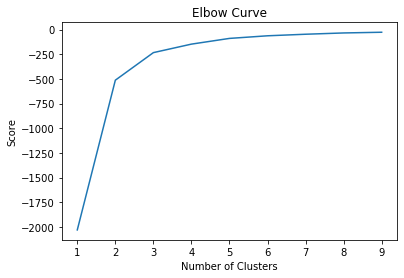

In [112]:
#Section of cluster 

X=allPickup.loc[:,['Id','latitude','longitude']]



K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = allPickup[['latitude']]
X_axis = allPickup[['longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()




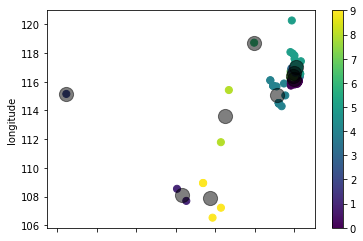

In [113]:
kmeans = KMeans(n_clusters = 10, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.
X['cluster_label'] = kmeans.fit_predict(X[X.columns[1:3]])
centers1 = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point


X.plot.scatter(x = 'latitude', y = 'longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers1[:, 0], centers1[:, 1], c='black', s=200, alpha=0.5)

In [114]:
print(centers1)

[[ 39.94449257 116.2088346 ]
 [ 25.75925    108.11929   ]
 [ 11.18238    115.15046   ]
 [ 40.00785537 116.57814531]
 [ 37.87395563 115.10980188]
 [ 40.23530352 117.04087827]
 [ 34.92349    118.72023   ]
 [ 39.88698759 116.40771215]
 [ 31.22302    113.605305  ]
 [ 29.3329925  107.91013   ]]


In [115]:
allPickup["cluster"] = X["cluster_label"]

In [116]:
allPickup

,Id,longitude,latitude,District,cluster
0,1120,116.41442,39.85614,fengtai,7
1,21,116.56620,40.07108,shunyi,3
2,5324,116.36391,39.96617,xicheng,7
3,5762,116.46485,39.92444,cahoyang,7
4,10307,116.44034,39.96209,cahoyang,7
...,...,...,...,...,...
563,10156,116.34249,39.94810,xicheng,7
564,205,116.76740,40.30642,miyun,5
565,2768,116.40527,39.92868,dongcheng,7
566,593,116.63074,40.12379,shunyi,3


/home/marco/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
/home/marco/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


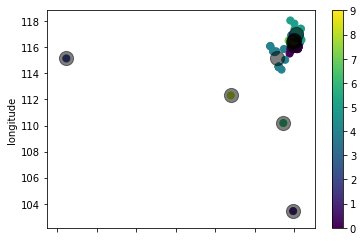

In [117]:
Y=allDropoff.loc[:,['Id','latitude','longitude']]
Z=np.array(centers1)
kmeans = KMeans(n_clusters = 10, init = Z,max_iter=1)
kmeans.fit(Y[Y.columns[1:3]]) # Compute k-means clustering.
Y['cluster_label'] = kmeans.fit_predict(Y[Y.columns[1:3]])
centers2 = kmeans.cluster_centers_

labels = kmeans.predict(Y[Y.columns[1:3]]) # Labels of each point

Y.plot.scatter(x = 'latitude', y = 'longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers2[:, 0], centers2[:, 1], c='black', s=200, alpha=0.5)

In [118]:
print(centers2)

[[ 39.95204985 116.19634152]
 [ 39.86672    103.43244   ]
 [ 11.18238    115.15046   ]
 [ 40.01294728 116.58227954]
 [ 37.78870895 115.22113105]
 [ 40.24730904 117.02943861]
 [ 38.62293    110.1919    ]
 [ 39.88272728 116.40922768]
 [ 31.97248    112.31143   ]
 [ 39.94205138 116.46230617]]


In [119]:
allDropoff["cluster"] = Y["cluster_label"]
allDropoff

,Id,longitude,latitude,District,cluster
0,1120,116.42108,39.93961,dongcheng,9
1,21,116.70697,39.72232,tongzhou,3
2,5324,116.37307,39.91673,xicheng,7
3,5762,116.52080,40.04511,cahoyang,3
4,10307,116.44020,39.96455,cahoyang,9
...,...,...,...,...,...
563,10156,116.24205,39.92856,haidan,0
564,205,116.69331,40.44614,huairou,5
565,2768,116.40033,39.91866,dongcheng,7
566,593,116.52954,40.14894,shunyi,3


In [120]:
def color_cluster(cluster_label):
    if(cluster_label == 0):
        return 'red'
    elif(cluster_label == 1):
        return 'green'
    elif(cluster_label == 2):
        return 'blue'
    elif(cluster_label == 3):
        return 'yellow'
    elif(cluster_label == 4):
        return 'brown'
    elif(cluster_label == 5):
        return 'black'
    elif(cluster_label == 6):
        return 'orange'
    elif(cluster_label == 7):
        return 'purple'
    elif(cluster_label == 8):
        return 'fuchsia'
    else:
        return 'lime'

In [121]:
m = folium.Map(
    location=[39.1759, 116.6016],
    tiles="cartodbpositron",
    zoom_start=2,
)

allPickup.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=0.5,
                                              color=color_cluster(row["cluster"]))
                                             .add_to(m), axis=1)
m

In [122]:
m = folium.Map(
    location=[39.1759, 116.6016],
    tiles="cartodbpositron",
    zoom_start=2,
)

allDropoff.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=0.5,
                                              color=color_cluster(row["cluster"]))
                                             .add_to(m), axis=1)
m

In [ ]:
kmeans = KMeans(n_clusters = 10, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.
X['cluster_label'] = kmeans.fit_predict(X[X.columns[1:3]])
centers1 = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point


X.plot.scatter(x = 'latitude', y = 'longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers1[:, 0], centers1[:, 1], c='black', s=200, alpha=0.5)

In [123]:
allPickupClusterCount = allPickup.groupby("cluster")["cluster"].count()
allDropoffClusterCount = allDropoff.groupby("cluster")["cluster"].count()

In [124]:
allPickupClusterCount

cluster
0     700
1       2
2       1
3     824
4      16
5     352
6       1
7    2150
8       2
9       4
Name: cluster, dtype: int64

In [125]:
allDropoffClusterCount

cluster
0     664
1       1
2       1
3     571
4      19
5     448
6       1
7    1444
8       1
9     902
Name: cluster, dtype: int64

In [111]:
X=[]
Y=[]
Z=[]


#end section of Cluster

In [13]:
#import poit of interests:
#Load all the point of interests in Beijing
import geopandas

bank =  geopandas.read_file('./../data-set/Pechino/Interessi/bank.geojson')
police =  geopandas.read_file('./../data-set/Pechino/Interessi/police.geojson')
ruins = geopandas.read_file('./../data-set/Pechino/Interessi/ruins.geojson')
museum=geopandas.read_file('./../data-set/Pechino/Interessi/museum.geojson')
dentist=geopandas.read_file('./../data-set/Pechino/Interessi/dentist.geojson')
attraction = geopandas.read_file('./../data-set/Pechino/Interessi/attraction.geojson')
taxi_stop = geopandas.read_file('./../data-set/Pechino/Interessi/taxi_stops.geojson')
theatre = geopandas.read_file('./../data-set/Pechino/Interessi/theatre.geojson')
univerisy=geopandas.read_file('./../data-set/Pechino/Interessi/university.geojson')
hospital=geopandas.read_file('./../../../Scaricati/export (2).geojson')
company = geopandas.read_file('./../data-set/Pechino/Interessi/company.geojson')
hotel = geopandas.read_file('./../data-set/Pechino/Interessi/hotel.geojson')
library=geopandas.read_file('./../../../Scaricati/export (3).geojson')

/home/marco/.local/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [127]:
#Latlon of pickup and dropoff
latlonPick=allPickup[['longitude','latitude']].to_numpy()
latlonDrop=allDropoff[['longitude','latitude']].to_numpy()

In [128]:
bank["geometry"][0].geom_type=='Polygon'

True

In [10]:
def checkInteress(points,interess,name): #Check the point of interess of a point
    i=0
    find = 0
    j=0
    result=[]
    while(j<int(points.size/2)):
        i=0
        find = 0
        while(i<len(interess['geometry']) and find ==0):
            center = interess['geometry'][i].centroid
            longI= center.x
            latI=center.y
            dist=measure(latI,longI,points[j][1],points[j][0])
            if(dist <= 0.2):
                result.append(name)
                find = 1
            i=i+1
        if(find == 0):
            result.append("none")
        j=j+1
    return result

In [11]:
def countInteress(attraction): #count the number of the point in a list
    i = 0
    count = 0
    while(i<len(attraction)):
        if(attraction[i]!="none"):
            count = count + 1
        i = i+1
    return count

In [168]:
def createList2(l1,l2,l3,l4,l5,l6,l7,l8,l9,l10,l11,l12): #create the list of all point of interess to instert in dataframe
    intervalInterest=range(0,int(latlonPick.size/2))
    allInteress = list(intervalInterest)
    
    i = 0
    while(i< len(l1)):   #use l1 because all the lists have same lenght
        if(l1[i]=="none" and l2[i]=="none" and l3[i]=="none" and l4[i]=="none" and l5[i]=="none" and l6[i]=="none" and l6[i]=="none" and l7[i]=="none" and l8[i]=="none" and l9[i]=="none" and l10[i]=="none" and l11[i]=="none" and l12[i]=="none"):
            allInteress[i]="NULL"
        else:
            allInteress[i] = "-"
            if(l1[i]!="none"):
                allInteress[i] = allInteress[i] +""+ l1[i] + "-"
            if(l2[i]!="none"):
                allInteress[i] = allInteress[i] +""+ l2[i] + "-"
            if(l3[i]!="none"):
                allInteress[i] = allInteress[i] +""+ l3[i] + "-"
            if(l4[i]!="none"):
                allInteress[i] = allInteress[i] +""+ l4[i] + "-"
            if(l5[i]!="none"):
                allInteress[i] = allInteress[i] +""+ l5[i] + "-"
            if(l6[i]!="none"):
                allInteress[i] = allInteress[i] +""+ l6[i] + "-"
            if(l7[i]!="none"):
                allInteress[i] =allInteress[i] +""+ l7[i] + "-"
            if(l8[i]!="none"):
                allInteress[i] = allInteress[i] +""+ l8[i] + "-"
            if(l9[i]!="none"):
                allInteress[i] =allInteress[i] +""+ l9[i] + "-"
            if(l10[i]!="none"):
                allInteress[i] =allInteress[i] +""+ l10[i] + "-"
            if(l11[i]!="none"):
                allInteress[i] = allInteress[i] +""+ l11[i] + "-"
            if(l12[i]!="none"):
                allInteress[i] =allInteress[i] +""+ l12[i] + "-"
        i=i+1;
    return allInteress

In [130]:
#start count point of interess for pick up 
listOfAttraction1 = checkInteress(latlonPick,museum,"museum")


In [131]:
listOfAttraction2 = checkInteress(latlonPick,bank,"bank")

In [132]:
listOfAttraction3 = checkInteress(latlonPick,attraction,"attraction")

In [133]:
listOfAttraction4 = checkInteress(latlonPick,taxi_stop,"taxi_stop")

In [134]:
listOfAttraction5 = checkInteress(latlonPick,police,"police")

In [135]:
listOfAttraction6 = checkInteress(latlonPick,univerisy,"university")

In [136]:
listOfAttraction7 = checkInteress(latlonPick,hospital,"hospital")

In [137]:
listOfAttraction8 = checkInteress(latlonPick,hotel,"hotel") 
listOfAttraction9 = checkInteress(latlonPick,dentist,"dentist")
listOfAttraction10=checkInteress(latlonPick,company,"company")
listOfAttraction11 = checkInteress(latlonPick,ruins,"ruins")
listOfAttraction12 = checkInteress(latlonPick,library,"library")

In [143]:
museumCount = countInteress(listOfAttraction1)
bankCount = countInteress(listOfAttraction2)
attractionCount = countInteress(listOfAttraction3)
taxi_stopCount = countInteress(listOfAttraction4)
policeCount = countInteress(listOfAttraction5)
universityCount = countInteress(listOfAttraction6)
hospitalCount = countInteress(listOfAttraction7)
hotelCount = countInteress(listOfAttraction8)
dentistCount = countInteress(listOfAttraction9)
companyCount = countInteress(listOfAttraction10)
ruinsCount = countInteress(listOfAttraction11)
libraryCount = countInteress(listOfAttraction12)
#end math interess

In [51]:
#nomi = ['museo','banche','attrazioni','libreria','aziende','rovine','stazioni-polizia','fermate-taxi','università','dentisti','ospedali','hotel']

interessi = [len(museum),len(bank),len(attraction),len(library),len(company).len(ruins),len(police),len(taxi_stop),len(univerisy),len(dentist),len(hospital),len(hotel)]

AttributeError: 'int' object has no attribute 'len'

In [144]:
#printing number of point of interess

museumCount

63

In [145]:
bankCount

456

In [146]:
attractionCount

49

In [147]:
taxi_stopCount

24

In [148]:
policeCount

45

In [149]:
universityCount

28

In [150]:
hospitalCount

129

In [151]:
hotelCount

26

In [152]:
dentistCount

16

In [153]:
companyCount

87

In [154]:
ruinsCount

17

In [155]:
libraryCount

15

In [169]:
allInteress = createList2(listOfAttraction1,listOfAttraction2,listOfAttraction3,listOfAttraction4,listOfAttraction5,listOfAttraction6,listOfAttraction7,listOfAttraction8,listOfAttraction9,listOfAttraction10,listOfAttraction11,listOfAttraction12)

In [200]:
allPickup["address"] = allPickupReverseGeo["address"]

In [201]:
allPickup["interess"] = allInteress

In [202]:
allPickup.to_csv("allPickup.csv")

In [174]:
#Start drop off math
listOfAttractionD1 = checkInteress(latlonDrop,museum,"museum")
listOfAttractionD2 = checkInteress(latlonDrop,bank,"bank")
listOfAttractionD3 = checkInteress(latlonDrop,attraction,"attraction")
listOfAttractionD4 = checkInteress(latlonDrop,taxi_stop,"taxi_stop")
listOfAttractionD5 = checkInteress(latlonDrop,police,"police")
listOfAttractionD6 = checkInteress(latlonDrop,univerisy,"university")
listOfAttractionD7 = checkInteress(latlonDrop,hospital,"hospital")
listOfAttractionD8 = checkInteress(latlonDrop,hotel,"hotel") 
listOfAttractionD9 = checkInteress(latlonDrop,dentist,"dentist")
listOfAttractionD10=checkInteress(latlonDrop,company,"company")
listOfAttractionD11 = checkInteress(latlonDrop,ruins,"ruins")
listOfAttractionD12 = checkInteress(latlonDrop,library,"library")

In [175]:
museumCountD = countInteress(listOfAttractionD1)
bankCountD = countInteress(listOfAttractionD2)
attractionCountD = countInteress(listOfAttractionD3)
taxi_stopCountD = countInteress(listOfAttractionD4)
policeCountD = countInteress(listOfAttractionD5)
universityCountD = countInteress(listOfAttractionD6)
hospitalCountD = countInteress(listOfAttractionD7)
hotelCountD = countInteress(listOfAttractionD8)
dentistCountD = countInteress(listOfAttractionD9)
companyCountD = countInteress(listOfAttractionD10)
ruinsCountD = countInteress(listOfAttractionD11)
libraryCountD = countInteress(listOfAttractionD12)
#end drop off math 

In [182]:
#start printing drop off interess
museumCountD

51

In [183]:
bankCountD

407

In [184]:
attractionCountD

53

In [185]:
taxi_stopCountD

18

In [186]:
policeCountD

38

In [187]:
universityCountD

28

In [188]:
hospitalCountD

104

In [189]:
hotelCountD

15

In [190]:
dentistCountD

15

In [191]:
companyCountD

70

In [192]:
ruinsCountD

14

In [193]:
libraryCountD

21

In [203]:
#Create the final drop off dataframe
allInteressDrop = createList2(listOfAttractionD1,listOfAttractionD2,listOfAttractionD3,listOfAttractionD4,listOfAttractionD5,listOfAttractionD6,listOfAttractionD7,listOfAttractionD8,listOfAttractionD9,listOfAttractionD10,listOfAttractionD11,listOfAttractionD12)

In [204]:
allDropoff["address"] = allDropoffReverseGeo["address"]

In [205]:
allDropoff["interess"] = allInteressDrop

In [206]:
allDropoff.to_csv("allDropoff.csv")

In [207]:
allPickup

,Id,longitude,latitude,District,cluster,address,interess
0,1120,116.41442,39.85614,fengtai,7,"南三环中路, 东罗园村, Fengtai District, Beijing, 100075...",NULL
1,21,116.56620,40.07108,shunyi,3,"小王辛庄村, Shunyi District, Beijing, 101312, China",NULL
2,5324,116.36391,39.96617,xicheng,7,"新街口外大街, Haidian District, Beijing, 100875, China",-bank-
3,5762,116.46485,39.92444,cahoyang,7,"South Tuanjiehu Road, Liulitun, Chaoyang Distr...",NULL
4,10307,116.44034,39.96209,cahoyang,7,"Taiyanggong, Chaoyang District, Beijing, 10002...",NULL
...,...,...,...,...,...,...,...
563,10156,116.34249,39.94810,xicheng,7,"武圣路, Nanmofang, Chaoyang District, Beijing, 10...",NULL
564,205,116.76740,40.30642,miyun,5,"万泉寺街, 东管头村, Fengtai District, Beijing, 100073,...",NULL
565,2768,116.40527,39.92868,dongcheng,7,"Daxing District, Daxing, Beijing, 102628, China",-police-
566,593,116.63074,40.12379,shunyi,3,"Tianzhu, Shunyi District, Beijing, 101312, China",NULL


In [208]:
allDropoff

,Id,longitude,latitude,District,cluster,address,interess
0,1120,116.42108,39.93961,dongcheng,9,"Dongzhimen Inner Street, Naga上院, Dongcheng Dis...",-bank-police-
1,21,116.70697,39.72232,tongzhou,3,"Tongzhou District, Yujiawu, Beijing, China",NULL
2,5324,116.37307,39.91673,xicheng,7,"Xicheng District, Beijing, 100032, China",NULL
3,5762,116.52080,40.04511,cahoyang,3,"Sunhe, Chaoyang District, Beijing, 100103, China",NULL
4,10307,116.44020,39.96455,cahoyang,9,"西坝河东里小区, Taiyanggong, Chaoyang District, Beiji...",NULL
...,...,...,...,...,...,...,...
563,10156,116.24205,39.92856,haidan,0,"武圣路, Nanmofang, Chaoyang District, Beijing, 10...",NULL
564,205,116.69331,40.44614,huairou,5,"安德路27路车总站, 安德路, Dongcheng District, Beijing, 1...",NULL
565,2768,116.40033,39.91866,dongcheng,7,"北沙滩桥南, G6辅路, 塔院村, Haidian District, Beijing, 1...",NULL
566,593,116.52954,40.14894,shunyi,3,"蓝靛厂路, 怡丽南园, Sijiqing, Haidian District, Beijin...",NULL


In [2]:

allPickupDistrict = pd.read_csv("allPickup.csv")
allDropoffDistrict = pd.read_csv("allDropoff.csv")

In [3]:
del allPickupDistrict["Unnamed: 0"]
del allDropoffDistrict["Unnamed: 0"]

In [5]:
#create a dataframe for all pickup District
allPickupChangping= allPickupDistrict[allPickupDistrict.District=='changping']
allPickupChaoyang=allPickupDistrict[allPickupDistrict.District=='cahoyang']
allPickupDaxing=allPickupDistrict[allPickupDistrict.District=='daxing']
allPickupDong=allPickupDistrict[allPickupDistrict.District=='dongcheng']
allPickupFang=allPickupDistrict[allPickupDistrict.District=='fangshan']
allPickupFengtai=allPickupDistrict[allPickupDistrict.District=='fengtai']
allPickupHaidan=allPickupDistrict[allPickupDistrict.District=='haidan']
allPickupHuar=allPickupDistrict[allPickupDistrict.District=='huarirou']
allPickupMen=allPickupDistrict[allPickupDistrict.District=='mentougou']
allPickupMiyun=allPickupDistrict[allPickupDistrict.District=='miyun']
allPickupPinggu=allPickupDistrict[allPickupDistrict.District=='pinggu']
allPickupShiji=allPickupDistrict[allPickupDistrict.District=='shijingshan']
allPickupShunyi=allPickupDistrict[allPickupDistrict.District=='shunyi']
allPickupTong=allPickupDistrict[allPickupDistrict.District=='tongzhou']
allPickupXicheng=allPickupDistrict[allPickupDistrict.District=='xicheng']
allPickupYang=allPickupDistrict[allPickupDistrict.District=='yanging']

In [6]:
#create a dataframe for all dropoff District
allDropoffChangping= allDropoffDistrict[allDropoffDistrict.District=='changping']
allDropoffChaoyang=allDropoffDistrict[allDropoffDistrict.District=='cahoyang']
allDropoffDaxing=allDropoffDistrict[allDropoffDistrict.District=='daxing']
allDropoffDong=allDropoffDistrict[allDropoffDistrict.District=='dongcheng']
allDropoffFang=allDropoffDistrict[allDropoffDistrict.District=='fangshan']
allDropoffFengtai=allDropoffDistrict[allDropoffDistrict.District=='fengtai']
allDropoffHaidan=allDropoffDistrict[allDropoffDistrict.District=='haidan']
allDropoffHuar=allDropoffDistrict[allDropoffDistrict.District=='huarirou']
allDropoffMen=allDropoffDistrict[allDropoffDistrict.District=='mentougou']
allDropoffMiyun=allDropoffDistrict[allDropoffDistrict.District=='miyun']
allDropoffPinggu=allDropoffDistrict[allDropoffDistrict.District=='pinggu']
allDropoffShiji=allDropoffDistrict[allDropoffDistrict.District=='shijingshan']
allDropoffShunyi=allDropoffDistrict[allDropoffDistrict.District=='shunyi']
allDropoffTong=allDropoffDistrict[allDropoffDistrict.District=='tongzhou']
allDropoffXicheng=allDropoffDistrict[allDropoffDistrict.District=='xicheng']
allDropoffYang=allDropoffDistrict[allDropoffDistrict.District=='yanging']

In [7]:
#create numpy array for latitude & longitude saves
#only pickups

latlonPChangping=allPickupChangping[['longitude','latitude']].to_numpy()
latlonPChaoyang=allPickupChaoyang[['longitude','latitude']].to_numpy()
latlonPDaxing=allPickupDaxing[['longitude','latitude']].to_numpy()
latlonPDong=allPickupDong[['longitude','latitude']].to_numpy()
latlonPFang=allPickupFang[['longitude','latitude']].to_numpy()
latlonPFeng=allPickupFengtai[['longitude','latitude']].to_numpy()
latlonPHaidan=allPickupHaidan[['longitude','latitude']].to_numpy()
latlonPHuar=allPickupHuar[['longitude','latitude']].to_numpy()
latlonPMen=allPickupMen[['longitude','latitude']].to_numpy()
latlonPMiyun=allPickupMiyun[['longitude','latitude']].to_numpy()
latlonPPinggu=allPickupPinggu[['longitude','latitude']].to_numpy()
latlonPShiji=allPickupShiji[['longitude','latitude']].to_numpy()
latlonPShunyi=allPickupShunyi[['longitude','latitude']].to_numpy()
latlonPTong=allPickupTong[['longitude','latitude']].to_numpy()
latlonPXicheng=allPickupXicheng[['longitude','latitude']].to_numpy()
latlonPYang=allPickupYang[['longitude','latitude']].to_numpy()


In [8]:
#create numpy Array
#drop off only

latlonDChangping=allDropoffChangping[['longitude','latitude']].to_numpy()
latlonDChaoyang=allDropoffChaoyang[['longitude','latitude']].to_numpy()
latlonDDaxing=allDropoffDaxing[['longitude','latitude']].to_numpy()
latlonDDong=allDropoffDong[['longitude','latitude']].to_numpy()
latlonDFang=allDropoffFang[['longitude','latitude']].to_numpy()
latlonDFeng=allDropoffFengtai[['longitude','latitude']].to_numpy()
latlonDHaidan=allDropoffHaidan[['longitude','latitude']].to_numpy()
latlonDHuar=allDropoffHuar[['longitude','latitude']].to_numpy()
latlonDMen=allDropoffMen[['longitude','latitude']].to_numpy()
latlonDMiyun=allDropoffMiyun[['longitude','latitude']].to_numpy()
latlonDPinggu=allDropoffPinggu[['longitude','latitude']].to_numpy()
latlonDShiji=allDropoffShiji[['longitude','latitude']].to_numpy()
latlonDShunyi=allDropoffShunyi[['longitude','latitude']].to_numpy()
latlonDTong=allDropoffTong[['longitude','latitude']].to_numpy()
latlonDXicheng=allDropoffXicheng[['longitude','latitude']].to_numpy()
latlonDYang=allDropoffYang[['longitude','latitude']].to_numpy()

In [ ]:
#Now create the list of point of interest for all district (24*16 lists)




#######################################################################

In [16]:
#check the number of points of interest for Changping district
#Pickup
LMuseumChangpingP = checkInteress(latlonPChangping,museum,"museum")
LBankChangpingP = checkInteress(latlonPChangping,bank,"bank")
LAttractionChangpingP = checkInteress(latlonPChangping,attraction,"attraction")
LTaxiChangpingP = checkInteress(latlonPChangping,taxi_stop,"taxi_stop")
LPoliceCahngpingP = checkInteress(latlonPChangping,police,"police")
LUniversityChangpingP = checkInteress(latlonPChangping,univerisy,"university")
LHospitalChangpingP = checkInteress(latlonPChangping,hospital,"hospital")
LHotelChangpingP = checkInteress(latlonPChangping,hotel,"hotel") 
LDentistChangpingP = checkInteress(latlonPChangping,dentist,"dentist")
LCompanyChangpingP=checkInteress(latlonPChangping,company,"company")
LRuinsChangpingP = checkInteress(latlonPChangping,ruins,"ruins")
LLibraryChangpingP = checkInteress(latlonPChangping,library,"library")

#Dropoff

LMuseumChangpingD= checkInteress(latlonDChangping,museum,"museum")
LBankChangpingD = checkInteress(latlonDChangping,bank,"bank")
LAttractionChangpingD = checkInteress(latlonDChangping,attraction,"attraction")
LTaxiChangpingD = checkInteress(latlonDChangping,taxi_stop,"taxi_stop")
LPoliceCahngpingD = checkInteress(latlonDChangping,police,"police")
LUniversityChangpingD = checkInteress(latlonDChangping,univerisy,"university")
LHospitalChangpingD = checkInteress(latlonDChangping,hospital,"hospital")
LHotelChangpingD = checkInteress(latlonDChangping,hotel,"hotel") 
LDentistChangpingD = checkInteress(latlonDChangping,dentist,"dentist")
LCompanyChangpingD =checkInteress(latlonDChangping,company,"company")
LRuinsChangpingD = checkInteress(latlonDChangping,ruins,"ruins")
LLibraryChangpingD = checkInteress(latlonDChangping,library,"library")

In [34]:
#count the number of point of interests in Changping
museumCountChangpingP = countInteress(LMuseumChangpingP)
bankCountChangpingP = countInteress(LBankChangpingP)
attractionCountChangpingP = countInteress(LAttractionChangpingP)
taxi_stopCountChangpingP = countInteress(LTaxiChangpingP)
policeCountChangpingP = countInteress(LPoliceCahngpingP)
universityCountChangpingP = countInteress(LUniversityChangpingP)
hospitalCountChangpingP = countInteress(LHospitalChangpingP)
hotelCountChangpingP = countInteress(LHotelChangpingP)
dentistCountChangpingP = countInteress(LDentistChangpingP)
companyCountChangpingP = countInteress(LCompanyChangpingP)
ruinsCountChangpingP = countInteress(LRuinsChangpingP)
libraryCountChangpingP = countInteress(LLibraryChangpingP)


museumCountChangpingD = countInteress(LMuseumChangpingD)
bankCountChangpingD = countInteress(LBankChangpingD)
attractionCountChangpingD = countInteress(LAttractionChangpingD)
taxi_stopCountChangpingD = countInteress(LTaxiChangpingD)
policeCountChangpingD = countInteress(LPoliceCahngpingD)
universityCountChangpingD = countInteress(LUniversityChangpingD)
hospitalCountChangpingD = countInteress(LHospitalChangpingD)
hotelCountChangpingD = countInteress(LHotelChangpingD)
dentistCountChangpingD = countInteress(LDentistChangpingD)
companyCountChangpingD = countInteress(LCompanyChangpingD)
ruinsCountChangpingD = countInteress(LRuinsChangpingD)
libraryCountChangpingD = countInteress(LLibraryChangpingD)

In [42]:
pickupChangping = {'museumCountChangpingP': museumCountChangpingP, 'bankCountChangpingP': bankCountChangpingP,
                  'attractionCountChangpingP':attractionCountChangpingP,
                   'taxi_stopCountChangpingP': taxi_stopCountChangpingP,
                  'policeCountChangpingP': policeCountChangpingP,
                  'universityCountChangpingP':universityCountChangpingP,
                  'hospitalCountChangpingP': hospitalCountChangpingP,
                  'hotelCountChangpingP': hotelCountChangpingP,
                  'dentistCountChangpingP': dentistCountChangpingP,
                  'companyCountChangpingP':companyCountChangpingP,
                  'ruinsCountChangpingP': ruinsCountChangpingP,
                  'libraryCountChangpingP': libraryCountChangpingP}

dropoffChangping = {'museumCountChangpingD': museumCountChangpingD, 'bankCountChangpingD': bankCountChangpingD,
                  'attractionCountChangpingD':attractionCountChangpingD,
                   'taxi_stopCountChangpingD': taxi_stopCountChangpingD,
                  'policeCountChangpingD': policeCountChangpingD,
                  'universityCountChangpingD':universityCountChangpingD,
                  'hospitalCountChangpingD': hospitalCountChangpingD,
                  'hotelCountChangpingD': hotelCountChangpingD,
                  'dentistCountChangpingD': dentistCountChangpingD,
                  'companyCountChangpingD':companyCountChangpingD,
                  'ruinsCountChangpingD': ruinsCountChangpingD,
                  'libraryCountChangpingD': libraryCountChangpingD}


In [43]:
#Print pickup ChangPing
pickupChangping

{'museumCountChangpingP': 0,
 'bankCountChangpingP': 7,
 'attractionCountChangpingP': 0,
 'taxi_stopCountChangpingP': 0,
 'policeCountChangpingP': 0,
 'universityCountChangpingP': 0,
 'hospitalCountChangpingP': 0,
 'hotelCountChangpingP': 0,
 'dentistCountChangpingP': 0,
 'companyCountChangpingP': 2,
 'ruinsCountChangpingP': 0,
 'libraryCountChangpingP': 0}

In [44]:
#Print dropoff ChangPing
dropoffChangping

{'museumCountChangpingD': 0,
 'bankCountChangpingD': 4,
 'attractionCountChangpingD': 0,
 'taxi_stopCountChangpingD': 0,
 'policeCountChangpingD': 0,
 'universityCountChangpingD': 0,
 'hospitalCountChangpingD': 1,
 'hotelCountChangpingD': 1,
 'dentistCountChangpingD': 0,
 'companyCountChangpingD': 3,
 'ruinsCountChangpingD': 0,
 'libraryCountChangpingD': 0}

In [17]:
#check the number of points of interest for Chaoyang district
#Pickup
LMuseumChaoyangP = checkInteress(latlonPChaoyang,museum,"museum")
LBankChaoyangP = checkInteress(latlonPChaoyang,bank,"bank")
LAttractionChaoyangP = checkInteress(latlonPChaoyang,attraction,"attraction")
LTaxiChaoyangP = checkInteress(latlonPChaoyang,taxi_stop,"taxi_stop")
LPoliceChaoyangP = checkInteress(latlonPChaoyang,police,"police")
LUniversityChaoyangP = checkInteress(latlonPChaoyang,univerisy,"university")
LHospitalChaoyangP = checkInteress(latlonPChaoyang,hospital,"hospital")
LHotelChaoyangP = checkInteress(latlonPChaoyang,hotel,"hotel") 
LDentistChaoyangP = checkInteress(latlonPChaoyang,dentist,"dentist")
LCompanyChaoyangP=checkInteress(latlonPChaoyang,company,"company")
LRuinsChaoyangP = checkInteress(latlonPChaoyang,ruins,"ruins")
LLibraryChaoyangP = checkInteress(latlonPChaoyang,library,"library")

#Dropoff

LMuseumChaoyangD= checkInteress(latlonDChaoyang,museum,"museum")
LBankChaoyangD = checkInteress(latlonDChaoyang,bank,"bank")
LAttractionChaoyangD = checkInteress(latlonDChaoyang,attraction,"attraction")
LTaxiChaoyangD = checkInteress(latlonDChaoyang,taxi_stop,"taxi_stop")
LPoliceChaoyangD = checkInteress(latlonDChaoyang,police,"police")
LUniversityChaoyangD = checkInteress(latlonDChaoyang,univerisy,"university")
LHospitalChaoyangD = checkInteress(latlonDChaoyang,hospital,"hospital")
LHotelChaoyangD = checkInteress(latlonDChaoyang,hotel,"hotel") 
LDentistChaoyangD = checkInteress(latlonDChaoyang,dentist,"dentist")
LCompanyChaoyangD =checkInteress(latlonDChaoyang,company,"company")
LRuinsChaoyangD = checkInteress(latlonDChaoyang,ruins,"ruins")
LLibraryChaoyangD = checkInteress(latlonDChaoyang,library,"library")

In [45]:
#count the number of point of interests in Chaoyang
museumCountChaoyangP = countInteress(LMuseumChaoyangP)
bankCountChaoyangP = countInteress(LBankChaoyangP)
attractionCountChaoyangP = countInteress(LAttractionChaoyangP)
taxi_stopCountChaoyangP = countInteress(LTaxiChaoyangP)
policeCountChaoyangP = countInteress(LPoliceChaoyangP)
universityCountChaoyangP = countInteress(LUniversityChaoyangP)
hospitalCountChaoyangP = countInteress(LHospitalChaoyangP)
hotelCountChaoyangP = countInteress(LHotelChaoyangP)
dentistCountChaoyangP = countInteress(LDentistChaoyangP)
companyCountChaoyangP = countInteress(LCompanyChaoyangP)
ruinsCountChaoyangP = countInteress(LRuinsChaoyangP)
libraryCountChaoyangP = countInteress(LLibraryChaoyangP)


museumCountChaoyangD = countInteress(LMuseumChaoyangD)
bankCountChaoyangD = countInteress(LBankChaoyangD)
attractionCountChaoyangD = countInteress(LAttractionChaoyangD)
taxi_stopCountChaoyangD = countInteress(LTaxiChaoyangD)
policeCountChaoyangD = countInteress(LPoliceChaoyangD)
universityCountChaoyangD = countInteress(LUniversityChaoyangD)
hospitalCountChaoyangD = countInteress(LHospitalChaoyangD)
hotelCountChaoyangD = countInteress(LHotelChaoyangD)
dentistCountChaoyangD = countInteress(LDentistChaoyangD)
companyCountChaoyangD = countInteress(LCompanyChaoyangD)
ruinsCountChaoyangD = countInteress(LRuinsChaoyangD)
libraryCountChaoyangD = countInteress(LLibraryChaoyangD)

In [46]:
pickupChaoyang = {'museumCountChaoyangP': museumCountChaoyangP, 'bankCountChaoyangP': bankCountChaoyangP,
                  'attractionCountChaoyangP':attractionCountChaoyangP,
                   'taxi_stopCountChaoyangP': taxi_stopCountChaoyangP,
                  'policeCountChaoyangP': policeCountChaoyangP,
                  'universityCountChaoyangP':universityCountChaoyangP,
                  'hospitalCountChaoyangP': hospitalCountChaoyangP,
                  'hotelCountChaoyangP': hotelCountChaoyangP,
                  'dentistCountChaoyangP': dentistCountChaoyangP,
                  'companyCountChaoyangP':companyCountChaoyangP,
                  'ruinsCountChaoyangP': ruinsCountChaoyangP,
                  'libraryCountChaoyangP': libraryCountChaoyangP}

dropoffChaoyang = {'museumCountChaoyangD': museumCountChaoyangD, 'bankCountChaoyangD': bankCountChaoyangD,
                  'attractionCountChaoyangD':attractionCountChaoyangD,
                   'taxi_stopCountChaoyangD': taxi_stopCountChaoyangD,
                  'policeCountChaoyangD': policeCountChaoyangD,
                  'universityCountChaoyangD':universityCountChaoyangD,
                  'hospitalCountChaoyangD': hospitalCountChaoyangD,
                  'hotelCountChaoyangD': hotelCountChaoyangD,
                  'dentistCountChaoyangD': dentistCountChaoyangD,
                  'companyCountChaoyangD':companyCountChaoyangD,
                  'ruinsCountChaoyangD': ruinsCountChaoyangD,
                  'libraryCountChaoyangD': libraryCountChaoyangD}



In [47]:
pickupChaoyang

{'museumCountChaoyangP': 8,
 'bankCountChaoyangP': 156,
 'attractionCountChaoyangP': 5,
 'taxi_stopCountChaoyangP': 6,
 'policeCountChaoyangP': 12,
 'universityCountChaoyangP': 6,
 'hospitalCountChaoyangP': 34,
 'hotelCountChaoyangP': 5,
 'dentistCountChaoyangP': 11,
 'companyCountChaoyangP': 33,
 'ruinsCountChaoyangP': 2,
 'libraryCountChaoyangP': 8}

In [48]:
dropoffChaoyang

{'museumCountChaoyangD': 10,
 'bankCountChaoyangD': 150,
 'attractionCountChaoyangD': 6,
 'taxi_stopCountChaoyangD': 0,
 'policeCountChaoyangD': 8,
 'universityCountChaoyangD': 14,
 'hospitalCountChaoyangD': 27,
 'hotelCountChaoyangD': 4,
 'dentistCountChaoyangD': 12,
 'companyCountChaoyangD': 30,
 'ruinsCountChaoyangD': 1,
 'libraryCountChaoyangD': 9}

In [18]:
#check the number of points of interest for Daxing district
#Pickup
LMuseumDaxingP = checkInteress(latlonPDaxing,museum,"museum")
LBankDaxingP = checkInteress(latlonPDaxing,bank,"bank")
LAttractionDaxingP = checkInteress(latlonPDaxing,attraction,"attraction")
LTaxiDaxingP = checkInteress(latlonPDaxing,taxi_stop,"taxi_stop")
LPoliceDaxingP = checkInteress(latlonPDaxing,police,"police")
LUniversityDaxingP = checkInteress(latlonPDaxing,univerisy,"university")
LHospitalDaxingP = checkInteress(latlonPDaxing,hospital,"hospital")
LHotelDaxingP = checkInteress(latlonPDaxing,hotel,"hotel") 
LDentistDaxingP = checkInteress(latlonPDaxing,dentist,"dentist")
LCompanyDaxingP=checkInteress(latlonPDaxing,company,"company")
LRuinsDaxingP = checkInteress(latlonPDaxing,ruins,"ruins")
LLibraryDaxingP = checkInteress(latlonPDaxing,library,"library")

#Dropoff

LMuseumDaxingD= checkInteress(latlonDDaxing,museum,"museum")
LBankDaxingD = checkInteress(latlonDDaxing,bank,"bank")
LAttractionDaxingD = checkInteress(latlonDDaxing,attraction,"attraction")
LTaxiDaxingD = checkInteress(latlonDDaxing,taxi_stop,"taxi_stop")
LPoliceDaxingD = checkInteress(latlonDDaxing,police,"police")
LUniversityDaxingD = checkInteress(latlonDDaxing,univerisy,"university")
LHospitalDaxingD = checkInteress(latlonDDaxing,hospital,"hospital")
LHotelDaxingD = checkInteress(latlonDDaxing,hotel,"hotel") 
LDentistDaxingD = checkInteress(latlonDDaxing,dentist,"dentist")
LCompanyDaxingD =checkInteress(latlonDDaxing,company,"company")
LRuinsDaxingD = checkInteress(latlonDDaxing,ruins,"ruins")
LLibraryDaxingD = checkInteress(latlonDDaxing,library,"library")

In [49]:
#count the number of point of interests in Daxing
museumCountDaxingP = countInteress(LMuseumDaxingP)
bankCountDaxingP = countInteress(LBankDaxingP)
attractionCountDaxingP = countInteress(LAttractionDaxingP)
taxi_stopCountDaxingP = countInteress(LTaxiDaxingP)
policeCountDaxingP = countInteress(LPoliceDaxingP)
universityCountDaxingP = countInteress(LUniversityDaxingP)
hospitalCountDaxingP = countInteress(LHospitalDaxingP)
hotelCountDaxingP = countInteress(LHotelDaxingP)
dentistCountDaxingP = countInteress(LDentistDaxingP)
companyCountDaxingP = countInteress(LCompanyDaxingP)
ruinsCountDaxingP = countInteress(LRuinsDaxingP)
libraryCountDaxingP = countInteress(LLibraryDaxingP)

museumCountDaxingD = countInteress(LMuseumDaxingD)
bankCountDaxingD = countInteress(LBankDaxingD)
attractionCountDaxingD = countInteress(LAttractionDaxingD)
taxi_stopCountDaxingD = countInteress(LTaxiDaxingD)
policeCountDaxingD = countInteress(LPoliceDaxingD)
universityCountDaxingD = countInteress(LUniversityDaxingD)
hospitalCountDaxingD = countInteress(LHospitalDaxingD)
hotelCountDaxingD = countInteress(LHotelDaxingD)
dentistCountDaxingD = countInteress(LDentistDaxingD)
companyCountDaxingD = countInteress(LCompanyDaxingD)
ruinsCountDaxingD = countInteress(LRuinsDaxingD)
libraryCountDaxingD = countInteress(LLibraryDaxingD)


In [50]:
pickupDaxing = {'museumCountDaxingP': museumCountDaxingP, 'bankCountDaxingP': bankCountDaxingP,
                  'attractionCountDaxingP':attractionCountDaxingP,
                   'taxi_stopCountDaxingP': taxi_stopCountDaxingP,
                  'policeCountDaxingP': policeCountDaxingP,
                  'universityCountDaxingP':universityCountDaxingP,
                  'hospitalCountDaxingP': hospitalCountDaxingP,
                  'hotelCountDaxingP': hotelCountDaxingP,
                  'dentistCountDaxingP': dentistCountDaxingP,
                  'companyCountDaxingP':companyCountDaxingP,
                  'ruinsCountDaxingP': ruinsCountDaxingP,
                  'libraryCountDaxingP': libraryCountDaxingP}

dropoffDaxing = {'museumCountDaxingD': museumCountDaxingD, 'bankCountDaxingD': bankCountDaxingD,
                  'attractionCountDaxingD':attractionCountDaxingD,
                   'taxi_stopCountDaxingD': taxi_stopCountDaxingD,
                  'policeCountDaxingD': policeCountDaxingD,
                  'universityCountDaxingD':universityCountDaxingD,
                  'hospitalCountDaxingD': hospitalCountDaxingD,
                  'hotelCountDaxingD': hotelCountDaxingD,
                  'dentistCountDaxingD': dentistCountDaxingD,
                  'companyCountDaxingD':companyCountDaxingD,
                  'ruinsCountDaxingD': ruinsCountDaxingD,
                  'libraryCountDaxingD': libraryCountDaxingD}

In [51]:
pickupDaxing

{'museumCountDaxingP': 0,
 'bankCountDaxingP': 5,
 'attractionCountDaxingP': 0,
 'taxi_stopCountDaxingP': 0,
 'policeCountDaxingP': 0,
 'universityCountDaxingP': 0,
 'hospitalCountDaxingP': 0,
 'hotelCountDaxingP': 0,
 'dentistCountDaxingP': 3,
 'companyCountDaxingP': 0,
 'ruinsCountDaxingP': 0,
 'libraryCountDaxingP': 0}

In [52]:
dropoffDaxing

{'museumCountDaxingD': 0,
 'bankCountDaxingD': 4,
 'attractionCountDaxingD': 0,
 'taxi_stopCountDaxingD': 0,
 'policeCountDaxingD': 0,
 'universityCountDaxingD': 0,
 'hospitalCountDaxingD': 0,
 'hotelCountDaxingD': 0,
 'dentistCountDaxingD': 0,
 'companyCountDaxingD': 0,
 'ruinsCountDaxingD': 0,
 'libraryCountDaxingD': 0}

In [19]:
#check the number of points of interest for Dong. district
#Pickup
LMuseumDongP = checkInteress(latlonPDong,museum,"museum")
LBankDongP = checkInteress(latlonPDong,bank,"bank")
LAttractionDongP = checkInteress(latlonPDong,attraction,"attraction")
LTaxiDongP = checkInteress(latlonPDong,taxi_stop,"taxi_stop")
LPoliceDongP = checkInteress(latlonPDong,police,"police")
LUniversityDongP = checkInteress(latlonPDong,univerisy,"university")
LHospitalDongP = checkInteress(latlonPDong,hospital,"hospital")
LHotelDongP = checkInteress(latlonPDong,hotel,"hotel") 
LDentistDongP = checkInteress(latlonPDong,dentist,"dentist")
LCompanyDongP=checkInteress(latlonPDong,company,"company")
LRuinsDongP = checkInteress(latlonPDong,ruins,"ruins")
LLibraryDongP = checkInteress(latlonPDong,library,"library")

#Dropoff

LMuseumDongD= checkInteress(latlonDDong,museum,"museum")
LBankDongD = checkInteress(latlonDDong,bank,"bank")
LAttractionDongD = checkInteress(latlonDDong,attraction,"attraction")
LTaxiDongD = checkInteress(latlonDDong,taxi_stop,"taxi_stop")
LPoliceDongD = checkInteress(latlonDDong,police,"police")
LUniversityDongD = checkInteress(latlonDDong,univerisy,"university")
LHospitalDongD = checkInteress(latlonDDong,hospital,"hospital")
LHotelDongD = checkInteress(latlonDDong,hotel,"hotel") 
LDentistDongD = checkInteress(latlonDDong,dentist,"dentist")
LCompanyDongD =checkInteress(latlonDDong,company,"company")
LRuinsDongD = checkInteress(latlonDDong,ruins,"ruins")
LLibraryDongD = checkInteress(latlonDDong,library,"library")

In [54]:
#count the number of point of interests in Dong
museumCountDongP = countInteress(LMuseumDongP)
bankCountDongP = countInteress(LBankDongP)
attractionCountDongP = countInteress(LAttractionDongP)
taxi_stopCountDongP = countInteress(LTaxiDongP)
policeCountDongP = countInteress(LPoliceDongP)
universityCountDongP = countInteress(LUniversityDongP)
hospitalCountDongP = countInteress(LHospitalDongP)
hotelCountDongP = countInteress(LHotelDongP)
dentistCountDongP = countInteress(LDentistDongP)
companyCountDongP = countInteress(LCompanyDongP)
ruinsCountDongP = countInteress(LRuinsDongP)
libraryCountDongP = countInteress(LLibraryDongP)

museumCountDongD = countInteress(LMuseumDongD)
bankCountDongD = countInteress(LBankDongD)
attractionCountDongD = countInteress(LAttractionDongD)
taxi_stopCountDongD = countInteress(LTaxiDongD)
policeCountDongD = countInteress(LPoliceDongD)
universityCountDongD = countInteress(LUniversityDongD)
hospitalCountDongD = countInteress(LHospitalDongD)
hotelCountDongD = countInteress(LHotelDongD)
dentistCountDongD = countInteress(LDentistDongD)
companyCountDongD = countInteress(LCompanyDongD)
ruinsCountDongD = countInteress(LRuinsDongD)
libraryCountDongD = countInteress(LLibraryDongD)

In [55]:
pickupDong = {'museumCountDongP': museumCountDongP, 'bankCountDongP': bankCountDongP,
                  'attractionCountDongP':attractionCountDongP,
                   'taxi_stopCountDongP': taxi_stopCountDongP,
                  'policeCountDongP': policeCountDongP,
                  'universityCountDongP':universityCountDongP,
                  'hospitalCountDongP': hospitalCountDongP,
                  'hotelCountDongP': hotelCountDongP,
                  'dentistCountDongP': dentistCountDongP,
                  'companyCountDongP':companyCountDongP,
                  'ruinsCountDongP': ruinsCountDongP,
                  'libraryCountDongP': libraryCountDongP}


dropoffDong = {'museumCountDongD': museumCountDongD, 'bankCountDongD': bankCountDongD,
                  'attractionCountDongD':attractionCountDongD,
                   'taxi_stopCountDongD': taxi_stopCountDongD,
                  'policeCountDongD': policeCountDongD,
                  'universityCountDongD':universityCountDongD,
                  'hospitalCountDongD': hospitalCountDongD,
                  'hotelCountDongD': hotelCountDongD,
                  'dentistCountDongD': dentistCountDongD,
                  'companyCountDongD':companyCountDongD,
                  'ruinsCountDongD': ruinsCountDongD,
                  'libraryCountDongD': libraryCountDongD}


In [56]:
pickupDong

{'museumCountDongP': 29,
 'bankCountDongP': 109,
 'attractionCountDongP': 30,
 'taxi_stopCountDongP': 4,
 'policeCountDongP': 11,
 'universityCountDongP': 3,
 'hospitalCountDongP': 35,
 'hotelCountDongP': 12,
 'dentistCountDongP': 0,
 'companyCountDongP': 19,
 'ruinsCountDongP': 6,
 'libraryCountDongP': 0}

In [57]:
dropoffDong

{'museumCountDongD': 20,
 'bankCountDongD': 89,
 'attractionCountDongD': 27,
 'taxi_stopCountDongD': 6,
 'policeCountDongD': 11,
 'universityCountDongD': 4,
 'hospitalCountDongD': 20,
 'hotelCountDongD': 3,
 'dentistCountDongD': 0,
 'companyCountDongD': 15,
 'ruinsCountDongD': 5,
 'libraryCountDongD': 2}

In [20]:
#check the number of points of interest for Fang district
#Pickup
LMuseumFangP = checkInteress(latlonPFang,museum,"museum")
LBankFangP = checkInteress(latlonPFang,bank,"bank")
LAttractionFangP = checkInteress(latlonPFang,attraction,"attraction")
LTaxiFangP = checkInteress(latlonPFang,taxi_stop,"taxi_stop")
LPoliceFangP = checkInteress(latlonPFang,police,"police")
LUniversityFangP = checkInteress(latlonPFang,univerisy,"university")
LHospitalFangP = checkInteress(latlonPFang,hospital,"hospital")
LHotelFangP = checkInteress(latlonPFang,hotel,"hotel") 
LDentistFangP = checkInteress(latlonPFang,dentist,"dentist")
LCompanyFangP=checkInteress(latlonPFang,company,"company")
LRuinsFangP = checkInteress(latlonPFang,ruins,"ruins")
LLibraryFangP = checkInteress(latlonPFang,library,"library")

#Dropoff

LMuseumFangD= checkInteress(latlonDFang,museum,"museum")
LBankFangD = checkInteress(latlonDFang,bank,"bank")
LAttractionFangD = checkInteress(latlonDFang,attraction,"attraction")
LTaxiFangD = checkInteress(latlonDFang,taxi_stop,"taxi_stop")
LPoliceFangD = checkInteress(latlonDFang,police,"police")
LUniversityFangD = checkInteress(latlonDFang,univerisy,"university")
LHospitalFangD = checkInteress(latlonDFang,hospital,"hospital")
LHotelFangD = checkInteress(latlonDFang,hotel,"hotel") 
LDentistFangD = checkInteress(latlonDFang,dentist,"dentist")
LCompanyFangD =checkInteress(latlonDFang,company,"company")
LRuinsFangD = checkInteress(latlonDFang,ruins,"ruins")
LLibraryFangD = checkInteress(latlonDFang,library,"library")

In [58]:
#count the number of point of interests in Fang
museumCountFangP = countInteress(LMuseumFangP)
bankCountFangP = countInteress(LBankFangP)
attractionCountFangP = countInteress(LAttractionFangP)
taxi_stopCountFangP = countInteress(LTaxiFangP)
policeCountFangP = countInteress(LPoliceFangP)
universityCountFangP = countInteress(LUniversityFangP)
hospitalCountFangP = countInteress(LHospitalFangP)
hotelCountFangP = countInteress(LHotelFangP)
dentistCountFangP = countInteress(LDentistFangP)
companyCountFangP = countInteress(LCompanyFangP)
ruinsCountFangP = countInteress(LRuinsFangP)
libraryCountFangP = countInteress(LLibraryFangP)

museumCountFangD = countInteress(LMuseumFangD)
bankCountFangD = countInteress(LBankFangD)
attractionCountFangD = countInteress(LAttractionFangD)
taxi_stopCountFangD = countInteress(LTaxiFangD)
policeCountFangD = countInteress(LPoliceFangD)
universityCountFangD = countInteress(LUniversityFangD)
hospitalCountFangD = countInteress(LHospitalFangD)
hotelCountFangD = countInteress(LHotelFangD)
dentistCountFangD = countInteress(LDentistFangD)
companyCountFangD = countInteress(LCompanyFangD)
ruinsCountFangD = countInteress(LRuinsFangD)
libraryCountFangD = countInteress(LLibraryFangD)

In [69]:
pickupFang = {'museumCountFangP': museumCountFangP, 'bankCountFangP': bankCountFangP,
                  'attractionCountFangP':attractionCountFangP,
                   'taxi_stopCountFangP': taxi_stopCountFangP,
                  'policeCountFangP': policeCountFangP,
                  'universityCountFangP':universityCountFangP,
                  'hospitalCountFangP': hospitalCountFangP,
                  'hotelCountFangP': hotelCountFangP,
                  'dentistCountFangP': dentistCountFangP,
                  'companyCountFangP':companyCountFangP,
                  'ruinsCountFangP': ruinsCountFangP,
                  'libraryCountFangP': libraryCountFangP}

dropoffFang = {'museumCountFangD': museumCountFangP, 'bankCountFangD': bankCountFangD,
                  'attractionCountFangD':attractionCountFangD,
                   'taxi_stopCountFangD': taxi_stopCountFangD,
                  'policeCountFangD': policeCountFangD,
                  'universityCountFangD':universityCountFangD,
                  'hospitalCountFangD': hospitalCountFangD,
                  'hotelCountFangD': hotelCountFangD,
                  'dentistCountFangD': dentistCountFangD,
                  'companyCountFangD':companyCountFangD,
                  'ruinsCountFangD': ruinsCountFangD,
                  'libraryCountFangD': libraryCountFangD}

In [68]:
pickupFang

{'museumCountFangP': 0,
 'bankCountFangP': 1,
 'attractionCountFangP': 0,
 'taxi_stopCountFangP': 0,
 'policeCountFangP': 0,
 'universityCountFangP': 0,
 'hospitalCountFangP': 0,
 'hotelCountFangP': 0,
 'dentistCountFangP': 0,
 'companyCountFangP': 0,
 'ruinsCountFangP': 0,
 'libraryCountFangP': 0}

In [61]:
dropoffFang

{'museumCountFangD': 0,
 'bankCountFangD': 0,
 'attractionCountFangD': 0,
 'taxi_stopCountFangD': 0,
 'policeCountFangD': 0,
 'universityCountFangD': 0,
 'hospitalCountFangD': 0,
 'hotelCountFangD': 0,
 'dentistCountFangD': 0,
 'companyCountFangD': 0,
 'ruinsCountFangD': 0,
 'libraryCountFangD': 0}

In [21]:
#check the number of points of interest for Feng. district
#Pickup
LMuseumFengP = checkInteress(latlonPFeng,museum,"museum")
LBankFengP = checkInteress(latlonPFeng,bank,"bank")
LAttractionFengP = checkInteress(latlonPFeng,attraction,"attraction")
LTaxiFengP = checkInteress(latlonPFeng,taxi_stop,"taxi_stop")
LPoliceFengP = checkInteress(latlonPFeng,police,"police")
LUniversityFengP = checkInteress(latlonPFeng,univerisy,"university")
LHospitalFengP = checkInteress(latlonPFeng,hospital,"hospital")
LHotelFengP = checkInteress(latlonPFeng,hotel,"hotel") 
LDentistFengP = checkInteress(latlonPFeng,dentist,"dentist")
LCompanyFengP=checkInteress(latlonPFeng,company,"company")
LRuinsFengP = checkInteress(latlonPFeng,ruins,"ruins")
LLibraryFengP = checkInteress(latlonPFeng,library,"library")

#Dropoff

LMuseumFengD= checkInteress(latlonDFeng,museum,"museum")
LBankFengD = checkInteress(latlonDFeng,bank,"bank")
LAttractionFengD = checkInteress(latlonDFeng,attraction,"attraction")
LTaxiFengD = checkInteress(latlonDFeng,taxi_stop,"taxi_stop")
LPoliceFengD = checkInteress(latlonDFeng,police,"police")
LUniversityFengD = checkInteress(latlonDFeng,univerisy,"university")
LHospitalFengD = checkInteress(latlonDFeng,hospital,"hospital")
LHotelFengD = checkInteress(latlonDFeng,hotel,"hotel") 
LDentistFengD = checkInteress(latlonDFeng,dentist,"dentist")
LCompanyFengD =checkInteress(latlonDFeng,company,"company")
LRuinsFengD = checkInteress(latlonDFeng,ruins,"ruins")
LLibraryFengD = checkInteress(latlonDFeng,library,"library")

In [62]:
#count the number of point of interests in Feng
museumCountFengP = countInteress(LMuseumFengP)
bankCountFengP = countInteress(LBankFengP)
attractionCountFengP = countInteress(LAttractionFengP)
taxi_stopCountFengP = countInteress(LTaxiFengP)
policeCountFengP = countInteress(LPoliceFengP)
universityCountFengP = countInteress(LUniversityFengP)
hospitalCountFengP = countInteress(LHospitalFengP)
hotelCountFengP = countInteress(LHotelFengP)
dentistCountFengP = countInteress(LDentistFengP)
companyCountFengP = countInteress(LCompanyFengP)
ruinsCountFengP = countInteress(LRuinsFengP)
libraryCountFengP = countInteress(LLibraryFengP)


museumCountFengD = countInteress(LMuseumFengD)
bankCountFengD = countInteress(LBankFengD)
attractionCountFengD = countInteress(LAttractionFengD)
taxi_stopCountFengD = countInteress(LTaxiFengD)
policeCountFengD = countInteress(LPoliceFengD)
universityCountFengD = countInteress(LUniversityFengD)
hospitalCountFengD = countInteress(LHospitalFengD)
hotelCountFengD = countInteress(LHotelFengD)
dentistCountFengD = countInteress(LDentistFengD)
companyCountFengD = countInteress(LCompanyFengD)
ruinsCountFengD = countInteress(LRuinsFengD)
libraryCountFengD = countInteress(LLibraryFengD)

In [65]:
pickupFeng = {'museumCountFengP': museumCountFengP, 'bankCountFengP': bankCountFengP,
                  'attractionCountFengP':attractionCountFengP,
                   'taxi_stopCountFengP': taxi_stopCountFengP,
                  'policeCountFengP': policeCountFengP,
                  'universityCountFengP':universityCountFengP,
                  'hospitalCountFengP': hospitalCountFengP,
                  'hotelCountFengP': hotelCountFengP,
                  'dentistCountFengP': dentistCountFengP,
                  'companyCountFengP':companyCountFengP,
                  'ruinsCountFengP': ruinsCountFengP,
                  'libraryCountFengP': libraryCountFengP}

dropoffFeng = {'museumCountFengD': museumCountFangP, 'bankCountFengD': bankCountFengD,
                  'attractionCountFengD':attractionCountFengD,
                   'taxi_stopCountFengD': taxi_stopCountFengD,
                  'policeCountFengD': policeCountFengD,
                  'universityCountFengD':universityCountFengD,
                  'hospitalCountFengD': hospitalCountFengD,
                  'hotelCountFengD': hotelCountFengD,
                  'dentistCountFengD': dentistCountFengD,
                  'companyCountFengD':companyCountFengD,
                  'ruinsCountFengD': ruinsCountFengD,
                  'libraryCountFengD': libraryCountFengD}

In [64]:
pickupFeng

{'museumCountFengP': 6,
 'bankCountFengP': 31,
 'attractionCountFengP': 2,
 'taxi_stopCountFengP': 0,
 'policeCountFengP': 0,
 'universityCountFengP': 0,
 'hospitalCountFengP': 9,
 'hotelCountFengP': 0,
 'dentistCountFengP': 0,
 'companyCountFengP': 9,
 'ruinsCountFengP': 0,
 'libraryCountFengP': 0}

In [66]:
dropoffFeng

{'museumCountFengD': 0,
 'bankCountFengD': 31,
 'attractionCountFengD': 2,
 'taxi_stopCountFengD': 0,
 'policeCountFengD': 0,
 'universityCountFengD': 0,
 'hospitalCountFengD': 9,
 'hotelCountFengD': 0,
 'dentistCountFengD': 0,
 'companyCountFengD': 6,
 'ruinsCountFengD': 0,
 'libraryCountFengD': 2}

In [67]:
#check the number of points of interest for Haidan district
#Pickup
LMuseumHaidanP = checkInteress(latlonPHaidan,museum,"museum")
LBankHaidanP = checkInteress(latlonPHaidan,bank,"bank")
LAttractionHaidanP = checkInteress(latlonPHaidan,attraction,"attraction")
LTaxiHaidanP = checkInteress(latlonPHaidan,taxi_stop,"taxi_stop")
LPoliceHaidanP = checkInteress(latlonPHaidan,police,"police")
LUniversityHaidanP = checkInteress(latlonPHaidan,univerisy,"university")
LHospitalHaidanP = checkInteress(latlonPHaidan,hospital,"hospital")
LHotelHaidanP = checkInteress(latlonPHaidan,hotel,"hotel") 
LDentistHaidanP = checkInteress(latlonPHaidan,dentist,"dentist")
LCompanyHaidanP=checkInteress(latlonPHaidan,company,"company")
LRuinsHaidanP = checkInteress(latlonPHaidan,ruins,"ruins")
LLibraryHaidanP = checkInteress(latlonPHaidan,library,"library")

#Dropoff

LMuseumHaidanD= checkInteress(latlonDHaidan,museum,"museum")
LBankHaidanD = checkInteress(latlonDHaidan,bank,"bank")
LAttractionHaidanD = checkInteress(latlonDHaidan,attraction,"attraction")
LTaxiHaidanD = checkInteress(latlonDHaidan,taxi_stop,"taxi_stop")
LPoliceHaidanD = checkInteress(latlonDHaidan,police,"police")
LUniversityHaidanD = checkInteress(latlonDHaidan,univerisy,"university")
LHospitalHaidanD = checkInteress(latlonDHaidan,hospital,"hospital")
LHotelHaidanD = checkInteress(latlonDHaidan,hotel,"hotel") 
LDentistHaidanD = checkInteress(latlonDHaidan,dentist,"dentist")
LCompanyHaidanD =checkInteress(latlonDHaidan,company,"company")
LRuinsHaidanD = checkInteress(latlonDHaidan,ruins,"ruins")
LLibraryHaidanD = checkInteress(latlonDHaidan,library,"library")

In [70]:
#count the number of point of interests in Haidan
museumCountHaidanP = countInteress(LMuseumHaidanP)
bankCountHaidanP = countInteress(LBankHaidanP)
attractionCountHaidanP = countInteress(LAttractionHaidanP)
taxi_stopCountHaidanP = countInteress(LTaxiHaidanP)
policeCountHaidanP = countInteress(LPoliceHaidanP)
universityCountHaidanP = countInteress(LUniversityHaidanP)
hospitalCountHaidanP = countInteress(LHospitalHaidanP)
hotelCountHaidanP = countInteress(LHotelHaidanP)
dentistCountHaidanP = countInteress(LDentistHaidanP)
companyCountHaidanP = countInteress(LCompanyHaidanP)
ruinsCountHaidanP = countInteress(LRuinsHaidanP)
libraryCountHaidanP = countInteress(LLibraryHaidanP)

museumCountHaidanD = countInteress(LMuseumHaidanD)
bankCountHaidanD = countInteress(LBankHaidanD)
attractionCountHaidanD = countInteress(LAttractionHaidanD)
taxi_stopCountHaidanD = countInteress(LTaxiHaidanD)
policeCountHaidanD = countInteress(LPoliceHaidanD)
universityCountHaidanD = countInteress(LUniversityHaidanD)
hospitalCountHaidanD = countInteress(LHospitalHaidanD)
hotelCountHaidanD = countInteress(LHotelHaidanD)
dentistCountHaidanD = countInteress(LDentistHaidanD)
companyCountHaidanD = countInteress(LCompanyHaidanD)
ruinsCountHaidanD = countInteress(LRuinsHaidanD)
libraryCountHaidanD = countInteress(LLibraryHaidanD)


In [71]:
pickupHaidan = {'museumCountHaidanP': museumCountHaidanP, 'bankCountHaidanP': bankCountHaidanP,
                  'attractionCountHaidanP':attractionCountHaidanP,
                   'taxi_stopCountHaidanP': taxi_stopCountHaidanP,
                  'policeCountHaidanP': policeCountHaidanP,
                  'universityCountHaidanP':universityCountHaidanP,
                  'hospitalCountHaidanP': hospitalCountHaidanP,
                  'hotelCountHaidanP': hotelCountHaidanP,
                  'dentistCountHaidanP': dentistCountHaidanP,
                  'companyCountHaidanP':companyCountHaidanP,
                  'ruinsCountHaidanP': ruinsCountHaidanP,
                  'libraryCountHaidanP': libraryCountHaidanP}

dropoffHaidan = {'museumCountHaidanD': museumCountHaidanD, 'bankCountHaidanD': bankCountHaidanD,
                  'attractionCountHaidanD':attractionCountHaidanD,
                   'taxi_stopCountHaidanD': taxi_stopCountHaidanD,
                  'policeCountHaidanD': policeCountHaidanD,
                  'universityCountHaidanD':universityCountHaidanD,
                  'hospitalCountHaidanD': hospitalCountHaidanD,
                  'hotelCountHaidanD': hotelCountHaidanD,
                  'dentistCountHaidanD': dentistCountHaidanD,
                  'companyCountHaidanD':companyCountHaidanD,
                  'ruinsCountHaidanD': ruinsCountHaidanD,
                  'libraryCountHaidanD': libraryCountHaidanD}

In [72]:
pickupHaidan

{'museumCountHaidanP': 4,
 'bankCountHaidanP': 83,
 'attractionCountHaidanP': 0,
 'taxi_stopCountHaidanP': 9,
 'policeCountHaidanP': 8,
 'universityCountHaidanP': 16,
 'hospitalCountHaidanP': 29,
 'hotelCountHaidanP': 6,
 'dentistCountHaidanP': 0,
 'companyCountHaidanP': 18,
 'ruinsCountHaidanP': 0,
 'libraryCountHaidanP': 3}

In [73]:
dropoffHaidan

{'museumCountHaidanD': 2,
 'bankCountHaidanD': 66,
 'attractionCountHaidanD': 0,
 'taxi_stopCountHaidanD': 8,
 'policeCountHaidanD': 8,
 'universityCountHaidanD': 9,
 'hospitalCountHaidanD': 17,
 'hotelCountHaidanD': 6,
 'dentistCountHaidanD': 2,
 'companyCountHaidanD': 10,
 'ruinsCountHaidanD': 0,
 'libraryCountHaidanD': 6}

In [23]:
#check the number of points of interest for Huar. district
#Pickup
LMuseumHuarP = checkInteress(latlonPHuar,museum,"museum")
LBankHuarP = checkInteress(latlonPHuar,bank,"bank")
LAttractionHuarP = checkInteress(latlonPHuar,attraction,"attraction")
LTaxiHuarP = checkInteress(latlonPHuar,taxi_stop,"taxi_stop")
LPoliceHuarP = checkInteress(latlonPHuar,police,"police")
LUniversityHuarP = checkInteress(latlonPHuar,univerisy,"university")
LHospitalHuarP = checkInteress(latlonPHuar,hospital,"hospital")
LHotelHuarP = checkInteress(latlonPHuar,hotel,"hotel") 
LDentistHuarP = checkInteress(latlonPHuar,dentist,"dentist")
LCompanyHuarP=checkInteress(latlonPHuar,company,"company")
LRuinsHuarP = checkInteress(latlonPHuar,ruins,"ruins")
LLibraryHuarP = checkInteress(latlonPHuar,library,"library")

#Dropoff

LMuseumHuarD= checkInteress(latlonDHuar,museum,"museum")
LBankHuarD = checkInteress(latlonDHuar,bank,"bank")
LAttractionHuarD = checkInteress(latlonDHuar,attraction,"attraction")
LTaxiHuarD = checkInteress(latlonDHuar,taxi_stop,"taxi_stop")
LPoliceHuarD = checkInteress(latlonDHuar,police,"police")
LUniversityHuarD = checkInteress(latlonDHuar,univerisy,"university")
LHospitalHuarD = checkInteress(latlonDHuar,hospital,"hospital")
LHotelHuarD = checkInteress(latlonDHuar,hotel,"hotel") 
LDentistHuarD = checkInteress(latlonDHuar,dentist,"dentist")
LCompanyHuarD =checkInteress(latlonDHuar,company,"company")
LRuinsHuarD = checkInteress(latlonDHuar,ruins,"ruins")
LLibraryHuarD = checkInteress(latlonDHuar,library,"library")

In [74]:
#count the number of point of interests in Huar.
museumCountHuarP = countInteress(LMuseumHuarP)
bankCountHuarP = countInteress(LBankHuarP)
attractionCountHuarP = countInteress(LAttractionHuarP)
taxi_stopCountHuarP = countInteress(LTaxiHuarP)
policeCountHuarP = countInteress(LPoliceHuarP)
universityCountHuarP = countInteress(LUniversityHuarP)
hospitalCountHuarP = countInteress(LHospitalHuarP)
hotelCountHuarP = countInteress(LHotelHuarP)
dentistCountHuarP = countInteress(LDentistHuarP)
companyCountHuarP = countInteress(LCompanyHuarP)
ruinsCountHuarP = countInteress(LRuinsHuarP)
libraryCountHuarP = countInteress(LLibraryHuarP)

museumCountHuarD = countInteress(LMuseumHuarD)
bankCountHuarD = countInteress(LBankHuarD)
attractionCountHuarD = countInteress(LAttractionHuarD)
taxi_stopCountHuarD = countInteress(LTaxiHuarD)
policeCountHuarD = countInteress(LPoliceHuarD)
universityCountHuarD = countInteress(LUniversityHuarD)
hospitalCountHuarD = countInteress(LHospitalHuarD)
hotelCountHuarD = countInteress(LHotelHuarD)
dentistCountHuarD = countInteress(LDentistHuarD)
companyCountHuarD = countInteress(LCompanyHuarD)
ruinsCountHuarD = countInteress(LRuinsHuarD)
libraryCountHuarD = countInteress(LLibraryHuarD)

In [75]:
pickupHuar = {'museumCountHuarP': museumCountHuarP, 'bankCountHuarP': bankCountHuarP,
                  'attractionCountHuarP':attractionCountHuarP,
                   'taxi_stopCountHuarP': taxi_stopCountHuarP,
                  'policeCountHuarP': policeCountHuarP,
                  'universityCountHuarP':universityCountHuarP,
                  'hospitalCountHuarP': hospitalCountHuarP,
                  'hotelCountHuarP': hotelCountHuarP,
                  'dentistCountHuarP': dentistCountHuarP,
                  'companyCountHuarP':companyCountHuarP,
                  'ruinsCountHuarP': ruinsCountHuarP,
                  'libraryCountHuarP': libraryCountHuarP}

dropoffHuar = {'museumCountHuarD': museumCountHuarD, 'bankCountHuarD': bankCountHuarD,
                  'attractionCountHuarD':attractionCountHuarD,
                   'taxi_stopCountHuarD': taxi_stopCountHuarD,
                  'policeCountHuarD': policeCountHuarD,
                  'universityCountHuarD':universityCountHuarD,
                  'hospitalCountHuarD': hospitalCountHuarD,
                  'hotelCountHuarD': hotelCountHuarD,
                  'dentistCountHuarD': dentistCountHuarD,
                  'companyCountHuarD':companyCountHuarD,
                  'ruinsCountHuarD': ruinsCountHuarD,
                  'libraryCountHuarD': libraryCountHuarD}

In [76]:
pickupHuar

{'museumCountHuarP': 0,
 'bankCountHuarP': 0,
 'attractionCountHuarP': 0,
 'taxi_stopCountHuarP': 0,
 'policeCountHuarP': 0,
 'universityCountHuarP': 0,
 'hospitalCountHuarP': 0,
 'hotelCountHuarP': 0,
 'dentistCountHuarP': 0,
 'companyCountHuarP': 0,
 'ruinsCountHuarP': 0,
 'libraryCountHuarP': 0}

In [77]:
dropoffHuar

{'museumCountHuarD': 0,
 'bankCountHuarD': 0,
 'attractionCountHuarD': 0,
 'taxi_stopCountHuarD': 0,
 'policeCountHuarD': 0,
 'universityCountHuarD': 0,
 'hospitalCountHuarD': 0,
 'hotelCountHuarD': 0,
 'dentistCountHuarD': 0,
 'companyCountHuarD': 0,
 'ruinsCountHuarD': 0,
 'libraryCountHuarD': 0}

In [24]:
#check the number of points of interest for Men. district
#Pickup
LMuseumMenP = checkInteress(latlonPMen,museum,"museum")
LBankMenP = checkInteress(latlonPMen,bank,"bank")
LAttractionMenP = checkInteress(latlonPMen,attraction,"attraction")
LTaxiMenP = checkInteress(latlonPMen,taxi_stop,"taxi_stop")
LPoliceMenP = checkInteress(latlonPMen,police,"police")
LUniversityMenP = checkInteress(latlonPMen,univerisy,"university")
LHospitalMenP = checkInteress(latlonPMen,hospital,"hospital")
LHotelMenP = checkInteress(latlonPMen,hotel,"hotel") 
LDentistMenP = checkInteress(latlonPMen,dentist,"dentist")
LCompanyMenP=checkInteress(latlonPMen,company,"company")
LRuinsMenP = checkInteress(latlonPMen,ruins,"ruins")
LLibraryMenP = checkInteress(latlonPMen,library,"library")

#Dropoff

LMuseumMenD= checkInteress(latlonDMen,museum,"museum")
LBankMenD = checkInteress(latlonDMen,bank,"bank")
LAttractionMenD = checkInteress(latlonDMen,attraction,"attraction")
LTaxiMenD = checkInteress(latlonDMen,taxi_stop,"taxi_stop")
LPoliceMenD = checkInteress(latlonDMen,police,"police")
LUniversityMenD = checkInteress(latlonDMen,univerisy,"university")
LHospitalMenD = checkInteress(latlonDMen,hospital,"hospital")
LHotelMenD = checkInteress(latlonDMen,hotel,"hotel") 
LDentistMenD = checkInteress(latlonDMen,dentist,"dentist")
LCompanyMenD =checkInteress(latlonDMen,company,"company")
LRuinsMenD = checkInteress(latlonDMen,ruins,"ruins")
LLibraryMenD = checkInteress(latlonDMen,library,"library")

In [78]:
#count the number of point of interests in Men.
museumCountMenP = countInteress(LMuseumMenP)
bankCountMenP = countInteress(LBankMenP)
attractionCountMenP = countInteress(LAttractionMenP)
taxi_stopCountMenP = countInteress(LTaxiMenP)
policeCountMenP = countInteress(LPoliceMenP)
universityCountMenP = countInteress(LUniversityMenP)
hospitalCountMenP = countInteress(LHospitalMenP)
hotelCountMenP = countInteress(LHotelMenP)
dentistCountMenP = countInteress(LDentistMenP)
companyCountMenP = countInteress(LCompanyMenP)
ruinsCountMenP = countInteress(LRuinsMenP)
libraryCountMenP = countInteress(LLibraryMenP)



museumCountMenD = countInteress(LMuseumMenD)
bankCountMenD = countInteress(LBankMenD)
attractionCountMenD = countInteress(LAttractionMenD)
taxi_stopCountMenD = countInteress(LTaxiMenD)
policeCountMenD = countInteress(LPoliceMenD)
universityCountMenD = countInteress(LUniversityMenD)
hospitalCountMenD = countInteress(LHospitalMenD)
hotelCountMenD = countInteress(LHotelMenD)
dentistCountMenD = countInteress(LDentistMenD)
companyCountMenD = countInteress(LCompanyMenD)
ruinsCountMenD = countInteress(LRuinsMenD)
libraryCountMenD = countInteress(LLibraryMenD)


In [79]:
pickupMen = {'museumCountMenP': museumCountMenP, 'bankCountMenP': bankCountMenP,
                  'attractionCountMenP':attractionCountMenP,
                   'taxi_stopCountMenP': taxi_stopCountMenP,
                  'policeCountMenP': policeCountMenP,
                  'universityCountMenP':universityCountMenP,
                  'hospitalCountMenP': hospitalCountMenP,
                  'hotelCountMenP': hotelCountMenP,
                  'dentistCountMenP': dentistCountMenP,
                  'companyCountMenP':companyCountMenP,
                  'ruinsCountMenP': ruinsCountMenP,
                  'libraryCountMenP': libraryCountMenP}


dropoffMen = {'museumCountMenD': museumCountMenD, 'bankCountMenD': bankCountMenD,
                  'attractionCountMenD':attractionCountMenD,
                   'taxi_stopCountMenD': taxi_stopCountMenD,
                  'policeCountMenD': policeCountMenD,
                  'universityCountMenD':universityCountMenD,
                  'hospitalCountMenD': hospitalCountMenD,
                  'hotelCountMenD': hotelCountMenD,
                  'dentistCountMenD': dentistCountMenD,
                  'companyCountMenD':companyCountMenD,
                  'ruinsCountMenD': ruinsCountMenD,
                  'libraryCountMenD': libraryCountMenD}

In [80]:
pickupMen

{'museumCountMenP': 0,
 'bankCountMenP': 0,
 'attractionCountMenP': 0,
 'taxi_stopCountMenP': 0,
 'policeCountMenP': 0,
 'universityCountMenP': 0,
 'hospitalCountMenP': 0,
 'hotelCountMenP': 0,
 'dentistCountMenP': 0,
 'companyCountMenP': 0,
 'ruinsCountMenP': 0,
 'libraryCountMenP': 0}

In [81]:
dropoffMen

{'museumCountMenD': 0,
 'bankCountMenD': 0,
 'attractionCountMenD': 0,
 'taxi_stopCountMenD': 0,
 'policeCountMenD': 0,
 'universityCountMenD': 0,
 'hospitalCountMenD': 0,
 'hotelCountMenD': 0,
 'dentistCountMenD': 0,
 'companyCountMenD': 0,
 'ruinsCountMenD': 0,
 'libraryCountMenD': 0}

In [25]:
#check the number of points of interest for Miyun district
#Pickup
LMuseumMiyunP = checkInteress(latlonPMiyun,museum,"museum")
LBankMiyunP = checkInteress(latlonPMiyun,bank,"bank")
LAttractionMiyunP = checkInteress(latlonPMiyun,attraction,"attraction")
LTaxiMiyunP = checkInteress(latlonPMiyun,taxi_stop,"taxi_stop")
LPoliceMiyunP = checkInteress(latlonPMiyun,police,"police")
LUniversityMiyunP = checkInteress(latlonPMiyun,univerisy,"university")
LHospitalMiyunP = checkInteress(latlonPMiyun,hospital,"hospital")
LHotelMiyunP = checkInteress(latlonPMiyun,hotel,"hotel") 
LDentistMiyunP = checkInteress(latlonPMiyun,dentist,"dentist")
LCompanyMiyunP=checkInteress(latlonPMiyun,company,"company")
LRuinsMiyunP = checkInteress(latlonPMiyun,ruins,"ruins")
LLibraryMiyunP = checkInteress(latlonPMiyun,library,"library")

#Dropoff

LMuseumMiyunD= checkInteress(latlonDMiyun,museum,"museum")
LBankMiyunD = checkInteress(latlonDMiyun,bank,"bank")
LAttractionMiyunD = checkInteress(latlonDMiyun,attraction,"attraction")
LTaxiMiyunD = checkInteress(latlonDMiyun,taxi_stop,"taxi_stop")
LPoliceMiyunD = checkInteress(latlonDMiyun,police,"police")
LUniversityMiyunD = checkInteress(latlonDMiyun,univerisy,"university")
LHospitalMiyunD = checkInteress(latlonDMiyun,hospital,"hospital")
LHotelMiyunD = checkInteress(latlonDMiyun,hotel,"hotel") 
LDentistMiyunD = checkInteress(latlonDMiyun,dentist,"dentist")
LCompanyMiyunD =checkInteress(latlonDMiyun,company,"company")
LRuinsMiyunD = checkInteress(latlonDMiyun,ruins,"ruins")
LLibraryMiyunD = checkInteress(latlonDMiyun,library,"library")

In [82]:
#count the number of point of interests in Miyun.
museumCountMiyunP = countInteress(LMuseumMiyunP)
bankCountMiyunP = countInteress(LBankMiyunP)
attractionCountMiyunP = countInteress(LAttractionMiyunP)
taxi_stopCountMiyunP = countInteress(LTaxiMiyunP)
policeCountMiyunP = countInteress(LPoliceMiyunP)
universityCountMiyunP = countInteress(LUniversityMiyunP)
hospitalCountMiyunP = countInteress(LHospitalMiyunP)
hotelCountMiyunP = countInteress(LHotelMiyunP)
dentistCountMiyunP = countInteress(LDentistMiyunP)
companyCountMiyunP = countInteress(LCompanyMiyunP)
ruinsCountMiyunP = countInteress(LRuinsMiyunP)
libraryCountMiyunP = countInteress(LLibraryMiyunP)


museumCountMiyunD = countInteress(LMuseumMiyunD)
bankCountMiyunD = countInteress(LBankMiyunD)
attractionCountMiyunD = countInteress(LAttractionMiyunD)
taxi_stopCountMiyunD = countInteress(LTaxiMiyunD)
policeCountMiyunD = countInteress(LPoliceMiyunD)
universityCountMiyunD = countInteress(LUniversityMiyunD)
hospitalCountMiyunD = countInteress(LHospitalMiyunD)
hotelCountMiyunD = countInteress(LHotelMiyunD)
dentistCountMiyunD = countInteress(LDentistMiyunD)
companyCountMiyunD = countInteress(LCompanyMiyunD)
ruinsCountMiyunD = countInteress(LRuinsMiyunD)
libraryCountMiyunD = countInteress(LLibraryMiyunD)

In [83]:
pickupMiyun = {'museumCountMiyunP': museumCountMiyunP, 'bankCountMiyunP': bankCountMiyunP,
                  'attractionCountMiyunP':attractionCountMiyunP,
                   'taxi_stopCountMiyunP': taxi_stopCountMiyunP,
                  'policeCountMiyunP': policeCountMiyunP,
                  'universityCountMiyunP':universityCountMiyunP,
                  'hospitalCountMiyunP': hospitalCountMiyunP,
                  'hotelCountMiyunP': hotelCountMiyunP,
                  'dentistCountMiyunP': dentistCountMiyunP,
                  'companyCountMiyunP':companyCountMiyunP,
                  'ruinsCountMiyunP': ruinsCountMiyunP,
                  'libraryCountMiyunP': libraryCountMiyunP}

dropoffMiyun = {'museumCountMiyunD': museumCountMiyunD, 'bankCountMiyunD': bankCountMiyunD,
                  'attractionCountMiyunD':attractionCountMiyunD,
                   'taxi_stopCountMiyunD': taxi_stopCountMiyunD,
                  'policeCountMiyunD': policeCountMiyunD,
                  'universityCountMiyunD':universityCountMiyunD,
                  'hospitalCountMiyunD': hospitalCountMiyunD,
                  'hotelCountMiyunD': hotelCountMiyunD,
                  'dentistCountMiyunD': dentistCountMiyunD,
                  'companyCountMiyunD':companyCountMiyunD,
                  'ruinsCountMiyunD': ruinsCountMiyunD,
                  'libraryCountMiyunD': libraryCountMiyunD}


In [84]:
pickupMiyun

{'museumCountMiyunP': 0,
 'bankCountMiyunP': 0,
 'attractionCountMiyunP': 0,
 'taxi_stopCountMiyunP': 0,
 'policeCountMiyunP': 0,
 'universityCountMiyunP': 0,
 'hospitalCountMiyunP': 0,
 'hotelCountMiyunP': 0,
 'dentistCountMiyunP': 0,
 'companyCountMiyunP': 0,
 'ruinsCountMiyunP': 0,
 'libraryCountMiyunP': 0}

In [85]:
dropoffMiyun

{'museumCountMiyunD': 0,
 'bankCountMiyunD': 0,
 'attractionCountMiyunD': 0,
 'taxi_stopCountMiyunD': 0,
 'policeCountMiyunD': 0,
 'universityCountMiyunD': 0,
 'hospitalCountMiyunD': 0,
 'hotelCountMiyunD': 0,
 'dentistCountMiyunD': 0,
 'companyCountMiyunD': 0,
 'ruinsCountMiyunD': 0,
 'libraryCountMiyunD': 0}

In [26]:
#check the number of points of interest for Pinggu district
#Pickup
LMuseumPingguP = checkInteress(latlonPPinggu,museum,"museum")
LBankPingguP = checkInteress(latlonPPinggu,bank,"bank")
LAttractionPingguP = checkInteress(latlonPPinggu,attraction,"attraction")
LTaxiPingguP = checkInteress(latlonPPinggu,taxi_stop,"taxi_stop")
LPolicePingguP = checkInteress(latlonPPinggu,police,"police")
LUniversityPingguP = checkInteress(latlonPPinggu,univerisy,"university")
LHospitalPingguP = checkInteress(latlonPPinggu,hospital,"hospital")
LHotelPingguP = checkInteress(latlonPPinggu,hotel,"hotel") 
LDentistPingguP = checkInteress(latlonPPinggu,dentist,"dentist")
LCompanyPingguP=checkInteress(latlonPPinggu,company,"company")
LRuinsPingguP = checkInteress(latlonPPinggu,ruins,"ruins")
LLibraryPingguP = checkInteress(latlonPPinggu,library,"library")

#Dropoff

LMuseumPingguD= checkInteress(latlonDPinggu,museum,"museum")
LBankPingguD = checkInteress(latlonDPinggu,bank,"bank")
LAttractionPingguD = checkInteress(latlonDPinggu,attraction,"attraction")
LTaxiPingguD = checkInteress(latlonDPinggu,taxi_stop,"taxi_stop")
LPolicePingguD = checkInteress(latlonDPinggu,police,"police")
LUniversityPingguD = checkInteress(latlonDPinggu,univerisy,"university")
LHospitalPingguD = checkInteress(latlonDPinggu,hospital,"hospital")
LHotelPingguD = checkInteress(latlonDPinggu,hotel,"hotel") 
LDentistPingguD = checkInteress(latlonDPinggu,dentist,"dentist")
LCompanyPingguD =checkInteress(latlonDPinggu,company,"company")
LRuinsPingguD = checkInteress(latlonDPinggu,ruins,"ruins")
LLibraryPingguD = checkInteress(latlonDPinggu,library,"library")

In [86]:
#count the number of point of interests in Pinggu.
museumCountPingguP = countInteress(LMuseumPingguP)
bankCountPingguP = countInteress(LBankPingguP)
attractionCountPingguP = countInteress(LAttractionPingguP)
taxi_stopCountPingguP = countInteress(LTaxiPingguP)
policeCountPingguP = countInteress(LPolicePingguP)
universityCountPingguP = countInteress(LUniversityPingguP)
hospitalCountPingguP = countInteress(LHospitalPingguP)
hotelCountPingguP = countInteress(LHotelPingguP)
dentistCountPingguP = countInteress(LDentistPingguP)
companyCountPingguP = countInteress(LCompanyPingguP)
ruinsCountPingguP = countInteress(LRuinsPingguP)
libraryCountPingguP = countInteress(LLibraryPingguP)


museumCountPingguD = countInteress(LMuseumPingguD)
bankCountPingguD = countInteress(LBankPingguD)
attractionCountPingguD = countInteress(LAttractionPingguD)
taxi_stopCountPingguD = countInteress(LTaxiPingguD)
policeCountPingguD = countInteress(LPolicePingguD)
universityCountPingguD = countInteress(LUniversityPingguD)
hospitalCountPingguD = countInteress(LHospitalPingguD)
hotelCountPingguD = countInteress(LHotelPingguD)
dentistCountPingguD = countInteress(LDentistPingguD)
companyCountPingguD = countInteress(LCompanyPingguD)
ruinsCountPingguD = countInteress(LRuinsPingguD)
libraryCountPingguD = countInteress(LLibraryPingguD)

In [87]:
pickupPinggu = {'museumCountPingguP': museumCountPingguP, 'bankCountPingguP': bankCountPingguP,
                  'attractionCountPingguP':attractionCountPingguP,
                   'taxi_stopCountPingguP': taxi_stopCountPingguP,
                  'policeCountPingguP': policeCountPingguP,
                  'universityCountPingguP':universityCountPingguP,
                  'hospitalCountPingguP': hospitalCountPingguP,
                  'hotelCountPingguP': hotelCountPingguP,
                  'dentistCountPingguP': dentistCountPingguP,
                  'companyCountPingguP':companyCountPingguP,
                  'ruinsCountPingguP': ruinsCountPingguP,
                  'libraryCountPingguP': libraryCountPingguP}


dropoffPinggu = {'museumCountPingguD': museumCountPingguD, 'bankCountPingguD': bankCountPingguD,
                  'attractionCountPingguD':attractionCountPingguD,
                   'taxi_stopCountPingguD': taxi_stopCountPingguD,
                  'policeCountPingguD': policeCountPingguD,
                  'universityCountPingguD':universityCountPingguD,
                  'hospitalCountPingguD': hospitalCountPingguD,
                  'hotelCountPingguD': hotelCountPingguD,
                  'dentistCountPingguD': dentistCountPingguD,
                  'companyCountPingguD':companyCountPingguD,
                  'ruinsCountPingguD': ruinsCountPingguD,
                  'libraryCountPingguD': libraryCountPingguD}

In [88]:
pickupPinggu

{'museumCountPingguP': 0,
 'bankCountPingguP': 0,
 'attractionCountPingguP': 0,
 'taxi_stopCountPingguP': 0,
 'policeCountPingguP': 0,
 'universityCountPingguP': 0,
 'hospitalCountPingguP': 0,
 'hotelCountPingguP': 0,
 'dentistCountPingguP': 0,
 'companyCountPingguP': 0,
 'ruinsCountPingguP': 0,
 'libraryCountPingguP': 0}

In [89]:
dropoffPinggu

{'museumCountPingguD': 0,
 'bankCountPingguD': 0,
 'attractionCountPingguD': 0,
 'taxi_stopCountPingguD': 0,
 'policeCountPingguD': 0,
 'universityCountPingguD': 0,
 'hospitalCountPingguD': 0,
 'hotelCountPingguD': 0,
 'dentistCountPingguD': 0,
 'companyCountPingguD': 0,
 'ruinsCountPingguD': 0,
 'libraryCountPingguD': 0}

In [27]:
#check the number of points of interest for Shiji district
#Pickup
LMuseumShijiP = checkInteress(latlonPShiji,museum,"museum")
LBankShijiP = checkInteress(latlonPShiji,bank,"bank")
LAttractionShijiP = checkInteress(latlonPShiji,attraction,"attraction")
LTaxiShijiP = checkInteress(latlonPShiji,taxi_stop,"taxi_stop")
LPoliceShijiP = checkInteress(latlonPShiji,police,"police")
LUniversityShijiP = checkInteress(latlonPShiji,univerisy,"university")
LHospitalShijiP = checkInteress(latlonPShiji,hospital,"hospital")
LHotelShijiP = checkInteress(latlonPShiji,hotel,"hotel") 
LDentistShijiP = checkInteress(latlonPShiji,dentist,"dentist")
LCompanyShijiP=checkInteress(latlonPShiji,company,"company")
LRuinsShijiP = checkInteress(latlonPShiji,ruins,"ruins")
LLibraryShijiP = checkInteress(latlonPShiji,library,"library")

#Dropoff

LMuseumShijiD= checkInteress(latlonDShiji,museum,"museum")
LBankShijiD = checkInteress(latlonDShiji,bank,"bank")
LAttractionShijiD = checkInteress(latlonDShiji,attraction,"attraction")
LTaxiShijiD = checkInteress(latlonDShiji,taxi_stop,"taxi_stop")
LPoliceShijiD = checkInteress(latlonDShiji,police,"police")
LUniversityShijiD = checkInteress(latlonDShiji,univerisy,"university")
LHospitalShijiD = checkInteress(latlonDShiji,hospital,"hospital")
LHotelShijiD = checkInteress(latlonDShiji,hotel,"hotel") 
LDentistShijiD = checkInteress(latlonDShiji,dentist,"dentist")
LCompanyShijiD =checkInteress(latlonDShiji,company,"company")
LRuinsShijiD = checkInteress(latlonDShiji,ruins,"ruins")
LLibraryShijiD = checkInteress(latlonDShiji,library,"library")

In [90]:
#count the number of point of interests in Shiji.
museumCountShijiP = countInteress(LMuseumShijiP)
bankCountShijiP = countInteress(LBankShijiP)
attractionCountShijiP = countInteress(LAttractionShijiP)
taxi_stopCountShijiP = countInteress(LTaxiShijiP)
policeCountShijiP = countInteress(LPoliceShijiP)
universityCountShijiP = countInteress(LUniversityShijiP)
hospitalCountShijiP = countInteress(LHospitalShijiP)
hotelCountShijiP = countInteress(LHotelShijiP)
dentistCountShijiP = countInteress(LDentistShijiP)
companyCountShijiP = countInteress(LCompanyShijiP)
ruinsCountShijiP = countInteress(LRuinsShijiP)
libraryCountShijiP = countInteress(LLibraryShijiP)


museumCountShijiD = countInteress(LMuseumShijiD)
bankCountShijiD = countInteress(LBankShijiD)
attractionCountShijiD = countInteress(LAttractionShijiD)
taxi_stopCountShijiD = countInteress(LTaxiShijiD)
policeCountShijiD = countInteress(LPoliceShijiD)
universityCountShijiD = countInteress(LUniversityShijiD)
hospitalCountShijiD = countInteress(LHospitalShijiD)
hotelCountShijiD = countInteress(LHotelShijiD)
dentistCountShijiD = countInteress(LDentistShijiD)
companyCountShijiD = countInteress(LCompanyShijiD)
ruinsCountShijiD = countInteress(LRuinsShijiD)
libraryCountShijiD = countInteress(LLibraryShijiD)

In [91]:
pickupShiji = {'museumCountShijiP': museumCountShijiP, 'bankCountShijiP': bankCountShijiP,
                  'attractionCountShijiP':attractionCountShijiP,
                   'taxi_stopCountShijiP': taxi_stopCountShijiP,
                  'policeCountShijiP': policeCountShijiP,
                  'universityCountShijiP':universityCountShijiP,
                  'hospitalCountShijiP': hospitalCountShijiP,
                  'hotelCountShijiP': hotelCountShijiP,
                  'dentistCountShijiP': dentistCountShijiP,
                  'companyCountShijiP':companyCountShijiP,
                  'ruinsCountShijiP': ruinsCountShijiP,
                  'libraryCountShijiP': libraryCountShijiP}

dropoffShiji = {'museumCountShijiD': museumCountShijiD, 'bankCountShijiD': bankCountShijiD,
                  'attractionCountShijiD':attractionCountShijiD,
                   'taxi_stopCountShijiD': taxi_stopCountShijiD,
                  'policeCountShijiD': policeCountShijiD,
                  'universityCountShijiD':universityCountShijiD,
                  'hospitalCountShijiD': hospitalCountShijiD,
                  'hotelCountShijiD': hotelCountShijiD,
                  'dentistCountShijiD': dentistCountShijiD,
                  'companyCountShijiD':companyCountShijiD,
                  'ruinsCountShijiD': ruinsCountShijiD,
                  'libraryCountShijiD': libraryCountShijiD}

In [92]:
pickupShiji

{'museumCountShijiP': 4,
 'bankCountShijiP': 3,
 'attractionCountShijiP': 0,
 'taxi_stopCountShijiP': 0,
 'policeCountShijiP': 0,
 'universityCountShijiP': 0,
 'hospitalCountShijiP': 3,
 'hotelCountShijiP': 0,
 'dentistCountShijiP': 0,
 'companyCountShijiP': 0,
 'ruinsCountShijiP': 1,
 'libraryCountShijiP': 0}

In [93]:
dropoffShiji

{'museumCountShijiD': 3,
 'bankCountShijiD': 3,
 'attractionCountShijiD': 0,
 'taxi_stopCountShijiD': 0,
 'policeCountShijiD': 0,
 'universityCountShijiD': 0,
 'hospitalCountShijiD': 3,
 'hotelCountShijiD': 0,
 'dentistCountShijiD': 0,
 'companyCountShijiD': 0,
 'ruinsCountShijiD': 0,
 'libraryCountShijiD': 0}

In [28]:
#check the number of points of interest for Shunyi district
#Pickup
LMuseumShunyiP = checkInteress(latlonPShunyi,museum,"museum")
LBankShunyiP = checkInteress(latlonPShunyi,bank,"bank")
LAttractionShunyiP = checkInteress(latlonPShunyi,attraction,"attraction")
LTaxiShunyiP = checkInteress(latlonPShunyi,taxi_stop,"taxi_stop")
LPoliceShunyiP = checkInteress(latlonPShunyi,police,"police")
LUniversityShunyiP = checkInteress(latlonPShunyi,univerisy,"university")
LHospitalShunyiP = checkInteress(latlonPShunyi,hospital,"hospital")
LHotelShunyiP = checkInteress(latlonPShunyi,hotel,"hotel") 
LDentistShunyiP = checkInteress(latlonPShunyi,dentist,"dentist")
LCompanyShunyiP=checkInteress(latlonPShunyi,company,"company")
LRuinsShunyiP = checkInteress(latlonPShunyi,ruins,"ruins")
LLibraryShunyiP = checkInteress(latlonPShunyi,library,"library")

#Dropoff

LMuseumShunyiD= checkInteress(latlonDShunyi,museum,"museum")
LBankShunyiD = checkInteress(latlonDShunyi,bank,"bank")
LAttractionShunyiD = checkInteress(latlonDShunyi,attraction,"attraction")
LTaxiShunyiD = checkInteress(latlonDShunyi,taxi_stop,"taxi_stop")
LPoliceShunyiD = checkInteress(latlonDShunyi,police,"police")
LUniversityShunyiD = checkInteress(latlonDShunyi,univerisy,"university")
LHospitalShunyiD = checkInteress(latlonDShunyi,hospital,"hospital")
LHotelShunyiD = checkInteress(latlonDShunyi,hotel,"hotel") 
LDentistShunyiD = checkInteress(latlonDShunyi,dentist,"dentist")
LCompanyShunyiD =checkInteress(latlonDShunyi,company,"company")
LRuinsShunyiD = checkInteress(latlonDShunyi,ruins,"ruins")
LLibraryShunyiD = checkInteress(latlonDShunyi,library,"library")

In [94]:
#count the number of point of interests in Shunyi.
museumCountShunyiP = countInteress(LMuseumShunyiP)
bankCountShunyiP = countInteress(LBankShunyiP)
attractionCountShunyiP = countInteress(LAttractionShunyiP)
taxi_stopCountShunyiP = countInteress(LTaxiShunyiP)
policeCountShunyiP = countInteress(LPoliceShunyiP)
universityCountShunyiP = countInteress(LUniversityShunyiP)
hospitalCountShunyiP = countInteress(LHospitalShunyiP)
hotelCountShunyiP = countInteress(LHotelShunyiP)
dentistCountShunyiP = countInteress(LDentistShunyiP)
companyCountShunyiP = countInteress(LCompanyShunyiP)
ruinsCountShunyiP = countInteress(LRuinsShunyiP)
libraryCountShunyiP = countInteress(LLibraryShunyiP)


museumCountShunyiD = countInteress(LMuseumShunyiD)
bankCountShunyiD = countInteress(LBankShunyiD)
attractionCountShunyiD = countInteress(LAttractionShunyiD)
taxi_stopCountShunyiD = countInteress(LTaxiShunyiD)
policeCountShunyiD = countInteress(LPoliceShunyiD)
universityCountShunyiD = countInteress(LUniversityShunyiD)
hospitalCountShunyiD = countInteress(LHospitalShunyiD)
hotelCountShunyiD = countInteress(LHotelShunyiD)
dentistCountShunyiD = countInteress(LDentistShunyiD)
companyCountShunyiD = countInteress(LCompanyShunyiD)
ruinsCountShunyiD = countInteress(LRuinsShunyiD)
libraryCountShunyiD = countInteress(LLibraryShunyiD)


In [95]:
pickupShunyi = {'museumCountShunyiP': museumCountShunyiP, 'bankCountShunyiP': bankCountShunyiP,
                  'attractionCountShunyiP':attractionCountShunyiP,
                   'taxi_stopCountShunyiP': taxi_stopCountShunyiP,
                  'policeCountShunyiP': policeCountShunyiP,
                  'universityCountShunyiP':universityCountShunyiP,
                  'hospitalCountShunyiP': hospitalCountShunyiP,
                  'hotelCountShunyiP': hotelCountShunyiP,
                  'dentistCountShunyiP': dentistCountShunyiP,
                  'companyCountShunyiP':companyCountShunyiP,
                  'ruinsCountShunyiP': ruinsCountShunyiP,
                  'libraryCountShunyiP': libraryCountShunyiP}

dropoffShunyi = {'museumCountShunyiD': museumCountShunyiD, 'bankCountShunyiD': bankCountShunyiD,
                  'attractionCountShunyiD':attractionCountShunyiD,
                   'taxi_stopCountShunyiD': taxi_stopCountShunyiD,
                  'policeCountShunyiD': policeCountShunyiD,
                  'universityCountShunyiD':universityCountShunyiD,
                  'hospitalCountShunyiD': hospitalCountShunyiD,
                  'hotelCountShunyiD': hotelCountShunyiD,
                  'dentistCountShunyiD': dentistCountShunyiD,
                  'companyCountShunyiD':companyCountShunyiD,
                  'ruinsCountShunyiD': ruinsCountShunyiD,
                  'libraryCountShunyiD': libraryCountShunyiD}

In [96]:
pickupShunyi

{'museumCountShunyiP': 0,
 'bankCountShunyiP': 0,
 'attractionCountShunyiP': 0,
 'taxi_stopCountShunyiP': 4,
 'policeCountShunyiP': 0,
 'universityCountShunyiP': 0,
 'hospitalCountShunyiP': 0,
 'hotelCountShunyiP': 2,
 'dentistCountShunyiP': 0,
 'companyCountShunyiP': 0,
 'ruinsCountShunyiP': 0,
 'libraryCountShunyiP': 0}

In [97]:
dropoffShunyi

{'museumCountShunyiD': 0,
 'bankCountShunyiD': 2,
 'attractionCountShunyiD': 0,
 'taxi_stopCountShunyiD': 3,
 'policeCountShunyiD': 0,
 'universityCountShunyiD': 0,
 'hospitalCountShunyiD': 0,
 'hotelCountShunyiD': 1,
 'dentistCountShunyiD': 0,
 'companyCountShunyiD': 0,
 'ruinsCountShunyiD': 0,
 'libraryCountShunyiD': 0}

In [29]:
#check the number of points of interest for Tong district
#Pickup
LMuseumTongP = checkInteress(latlonPTong,museum,"museum")
LBankTongP = checkInteress(latlonPTong,bank,"bank")
LAttractionTongP = checkInteress(latlonPTong,attraction,"attraction")
LTaxiTongP = checkInteress(latlonPTong,taxi_stop,"taxi_stop")
LPoliceTongP = checkInteress(latlonPTong,police,"police")
LUniversityTongP = checkInteress(latlonPTong,univerisy,"university")
LHospitalTongP = checkInteress(latlonPTong,hospital,"hospital")
LHotelTongP = checkInteress(latlonPTong,hotel,"hotel") 
LDentistTongP = checkInteress(latlonPTong,dentist,"dentist")
LCompanyTongP=checkInteress(latlonPTong,company,"company")
LRuinsTongP = checkInteress(latlonPTong,ruins,"ruins")
LLibraryTongP = checkInteress(latlonPTong,library,"library")

#Dropoff

LMuseumTongD= checkInteress(latlonDTong,museum,"museum")
LBankTongD = checkInteress(latlonDTong,bank,"bank")
LAttractionTongD = checkInteress(latlonDTong,attraction,"attraction")
LTaxiTongD = checkInteress(latlonDTong,taxi_stop,"taxi_stop")
LPoliceTongD = checkInteress(latlonDTong,police,"police")
LUniversityTongD = checkInteress(latlonDTong,univerisy,"university")
LHospitalTongD = checkInteress(latlonDTong,hospital,"hospital")
LHotelTongD = checkInteress(latlonDTong,hotel,"hotel") 
LDentistTongD = checkInteress(latlonDTong,dentist,"dentist")
LCompanyTongD =checkInteress(latlonDTong,company,"company")
LRuinsTongD = checkInteress(latlonDTong,ruins,"ruins")
LLibraryTongD = checkInteress(latlonDTong,library,"library")

In [98]:
#count the number of point of interests in Tong.
museumCountTongP = countInteress(LMuseumTongP)
bankCountTongP = countInteress(LBankTongP)
attractionCountTongP = countInteress(LAttractionTongP)
taxi_stopCountTongP = countInteress(LTaxiTongP)
policeCountTongP = countInteress(LPoliceTongP)
universityCountTongP = countInteress(LUniversityTongP)
hospitalCountTongP = countInteress(LHospitalTongP)
hotelCountTongP = countInteress(LHotelTongP)
dentistCountTongP = countInteress(LDentistTongP)
companyCountTongP = countInteress(LCompanyTongP)
ruinsCountTongP = countInteress(LRuinsTongP)
libraryCountTongP = countInteress(LLibraryTongP)



museumCountTongD = countInteress(LMuseumTongD)
bankCountTongD = countInteress(LBankTongD)
attractionCountTongD = countInteress(LAttractionTongD)
taxi_stopCountTongD = countInteress(LTaxiTongD)
policeCountTongD = countInteress(LPoliceTongD)
universityCountTongD = countInteress(LUniversityTongD)
hospitalCountTongD = countInteress(LHospitalTongD)
hotelCountTongD = countInteress(LHotelTongD)
dentistCountTongD = countInteress(LDentistTongD)
companyCountTongD = countInteress(LCompanyTongD)
ruinsCountTongD = countInteress(LRuinsTongD)
libraryCountTongD = countInteress(LLibraryTongD)

In [99]:
pickupTong = {'museumCountTongP': museumCountTongP, 'bankCountTongP': bankCountTongP,
                  'attractionCountTongP':attractionCountTongP,
                   'taxi_stopCountTongP': taxi_stopCountTongP,
                  'policeCountTongP': policeCountTongP,
                  'universityCountTongP':universityCountTongP,
                  'hospitalCountTongP': hospitalCountTongP,
                  'hotelCountTongP': hotelCountTongP,
                  'dentistCountTongP': dentistCountTongP,
                  'companyCountTongP':companyCountTongP,
                  'ruinsCountTongP': ruinsCountTongP,
                  'libraryCountTongP': libraryCountTongP}


dropoffTong = {'museumCountTongD': museumCountTongD, 'bankCountTongD': bankCountTongD,
                  'attractionCountTongD':attractionCountTongD,
                   'taxi_stopCountTongD': taxi_stopCountTongD,
                  'policeCountTongD': policeCountTongD,
                  'universityCountTongD':universityCountTongD,
                  'hospitalCountTongD': hospitalCountTongD,
                  'hotelCountTongD': hotelCountTongD,
                  'dentistCountTongD': dentistCountTongD,
                  'companyCountTongD':companyCountTongD,
                  'ruinsCountTongD': ruinsCountTongD,
                  'libraryCountTongD': libraryCountTongD}

In [100]:
pickupTong

{'museumCountTongP': 0,
 'bankCountTongP': 0,
 'attractionCountTongP': 0,
 'taxi_stopCountTongP': 0,
 'policeCountTongP': 0,
 'universityCountTongP': 0,
 'hospitalCountTongP': 0,
 'hotelCountTongP': 0,
 'dentistCountTongP': 0,
 'companyCountTongP': 0,
 'ruinsCountTongP': 0,
 'libraryCountTongP': 0}

In [101]:
dropoffTong

{'museumCountTongD': 1,
 'bankCountTongD': 0,
 'attractionCountTongD': 0,
 'taxi_stopCountTongD': 0,
 'policeCountTongD': 0,
 'universityCountTongD': 0,
 'hospitalCountTongD': 0,
 'hotelCountTongD': 0,
 'dentistCountTongD': 0,
 'companyCountTongD': 0,
 'ruinsCountTongD': 0,
 'libraryCountTongD': 0}

In [30]:
#check the number of points of interest for Xicheng district
#Pickup
LMuseumXichengP = checkInteress(latlonPXicheng,museum,"museum")
LBankXichengP = checkInteress(latlonPXicheng,bank,"bank")
LAttractionXichengP = checkInteress(latlonPTong,attraction,"attraction")
LTaxiXichengP = checkInteress(latlonPXicheng,taxi_stop,"taxi_stop")
LPoliceXichengP = checkInteress(latlonPXicheng,police,"police")
LUniversityXichengP = checkInteress(latlonPXicheng,univerisy,"university")
LHospitalXichengP = checkInteress(latlonPXicheng,hospital,"hospital")
LHotelXichengP = checkInteress(latlonPXicheng,hotel,"hotel") 
LDentistXichengP = checkInteress(latlonPXicheng,dentist,"dentist")
LCompanyXichengP=checkInteress(latlonPXicheng,company,"company")
LRuinsXichengP = checkInteress(latlonPXicheng,ruins,"ruins")
LLibraryXichengP = checkInteress(latlonPXicheng,library,"library")

#Dropoff

LMuseumXichengD= checkInteress(latlonDXicheng,museum,"museum")
LBankXichengD = checkInteress(latlonDXicheng,bank,"bank")
LAttractionXichengD = checkInteress(latlonDXicheng,attraction,"attraction")
LTaxiXichengD = checkInteress(latlonDXicheng,taxi_stop,"taxi_stop")
LPoliceXichengD = checkInteress(latlonDXicheng,police,"police")
LUniversityXichengD = checkInteress(latlonDXicheng,univerisy,"university")
LHospitalXichengD = checkInteress(latlonDXicheng,hospital,"hospital")
LHotelXichengD = checkInteress(latlonDXicheng,hotel,"hotel") 
LDentistXichengD = checkInteress(latlonDXicheng,dentist,"dentist")
LCompanyXichengD =checkInteress(latlonDXicheng,company,"company")
LRuinsXichengD = checkInteress(latlonDXicheng,ruins,"ruins")
LLibraryXichengD = checkInteress(latlonDXicheng,library,"library")

In [102]:
#count the number of point of interests in Xicheng.
museumCountXichengP = countInteress(LMuseumXichengP)
bankCountXichengP = countInteress(LBankXichengP)
attractionCountXichengP = countInteress(LAttractionXichengP)
taxi_stopCountXichengP = countInteress(LTaxiXichengP)
policeCountXichengP = countInteress(LPoliceXichengP)
universityCountXichengP = countInteress(LUniversityXichengP)
hospitalCountXichengP = countInteress(LHospitalXichengP)
hotelCountXichengP = countInteress(LHotelXichengP)
dentistCountXichengP = countInteress(LDentistXichengP)
companyCountXichengP = countInteress(LCompanyXichengP)
ruinsCountXichengP = countInteress(LRuinsXichengP)
libraryCountXichengP = countInteress(LLibraryXichengP)


museumCountXichengD = countInteress(LMuseumXichengD)
bankCountXichengD = countInteress(LBankXichengD)
attractionCountXichengD = countInteress(LAttractionXichengD)
taxi_stopCountXichengD = countInteress(LTaxiXichengD)
policeCountXichengD = countInteress(LPoliceXichengD)
universityCountXichengD = countInteress(LUniversityXichengD)
hospitalCountXichengD = countInteress(LHospitalXichengD)
hotelCountXichengD = countInteress(LHotelXichengD)
dentistCountXichengD = countInteress(LDentistXichengD)
companyCountXichengD = countInteress(LCompanyXichengD)
ruinsCountXichengD = countInteress(LRuinsXichengD)
libraryCountXichengD = countInteress(LLibraryXichengD)

In [103]:
pickupXicheng = {'museumCountXichengP': museumCountXichengP, 'bankCountXichengP': bankCountXichengP,
                  'attractionCountXichengP':attractionCountXichengP,
                   'taxi_stopCountXichengP': taxi_stopCountXichengP,
                  'policeCountXichengP': policeCountXichengP,
                  'universityCountXichengP':universityCountXichengP,
                  'hospitalCountXichengP': hospitalCountXichengP,
                  'hotelCountXichengP': hotelCountXichengP,
                  'dentistCountXichengP': dentistCountXichengP,
                  'companyCountXichengP':companyCountXichengP,
                  'ruinsCountXichengP': ruinsCountXichengP,
                  'libraryCountXichengP': libraryCountXichengP}

dropoffXicheng = {'museumCountXichengD': museumCountXichengD, 'bankCountXichengD': bankCountXichengD,
                  'attractionCountXichengD':attractionCountXichengD,
                   'taxi_stopCountXichengD': taxi_stopCountXichengD,
                  'policeCountXichengD': policeCountXichengD,
                  'universityCountXichengD':universityCountXichengD,
                  'hospitalCountXichengD': hospitalCountXichengD,
                  'hotelCountXichengD': hotelCountXichengD,
                  'dentistCountXichengD': dentistCountXichengD,
                  'companyCountXichengD':companyCountXichengD,
                  'ruinsCountXichengD': ruinsCountXichengD,
                  'libraryCountXichengD': libraryCountXichengD}

In [104]:
pickupXicheng

{'museumCountXichengP': 12,
 'bankCountXichengP': 61,
 'attractionCountXichengP': 0,
 'taxi_stopCountXichengP': 1,
 'policeCountXichengP': 14,
 'universityCountXichengP': 3,
 'hospitalCountXichengP': 19,
 'hotelCountXichengP': 1,
 'dentistCountXichengP': 2,
 'companyCountXichengP': 6,
 'ruinsCountXichengP': 8,
 'libraryCountXichengP': 4}

In [105]:
dropoffXicheng

{'museumCountXichengD': 9,
 'bankCountXichengD': 58,
 'attractionCountXichengD': 18,
 'taxi_stopCountXichengD': 1,
 'policeCountXichengD': 11,
 'universityCountXichengD': 1,
 'hospitalCountXichengD': 27,
 'hotelCountXichengD': 0,
 'dentistCountXichengD': 1,
 'companyCountXichengD': 6,
 'ruinsCountXichengD': 8,
 'libraryCountXichengD': 2}

In [31]:
#check the number of points of interest for Yang district
#Pickup
LMuseumYangP = checkInteress(latlonPYang,museum,"museum")
LBankYangP = checkInteress(latlonPYang,bank,"bank")
LAttractionYangP = checkInteress(latlonPYang,attraction,"attraction")
LTaxiYangP = checkInteress(latlonPYang,taxi_stop,"taxi_stop")
LPoliceYangP = checkInteress(latlonPYang,police,"police")
LUniversityYangP = checkInteress(latlonPYang,univerisy,"university")
LHospitalYangP = checkInteress(latlonPYang,hospital,"hospital")
LHotelYangP = checkInteress(latlonPYang,hotel,"hotel") 
LDentistYangP = checkInteress(latlonPYang,dentist,"dentist")
LCompanyYangP=checkInteress(latlonPYang,company,"company")
LRuinsYangP = checkInteress(latlonPYang,ruins,"ruins")
LLibraryYangP = checkInteress(latlonPYang,library,"library")

#Dropoff

LMuseumYangD= checkInteress(latlonDYang,museum,"museum")
LBankYangD = checkInteress(latlonDYang,bank,"bank")
LAttractionYangD = checkInteress(latlonDYang,attraction,"attraction")
LTaxiYangD = checkInteress(latlonDYang,taxi_stop,"taxi_stop")
LPoliceYangD = checkInteress(latlonDYang,police,"police")
LUniversityYangD = checkInteress(latlonDYang,univerisy,"university")
LHospitalYangD = checkInteress(latlonDYang,hospital,"hospital")
LHotelYangD = checkInteress(latlonDYang,hotel,"hotel") 
LDentistYangD = checkInteress(latlonDYang,dentist,"dentist")
LCompanyYangD =checkInteress(latlonDYang,company,"company")
LRuinsYangD = checkInteress(latlonDYang,ruins,"ruins")
LLibraryYangD = checkInteress(latlonDYang,library,"library")

In [106]:
#count the number of point of interests in Yang.
museumCountYangP = countInteress(LMuseumYangP)
bankCountYangP = countInteress(LBankYangP)
attractionCountYangP = countInteress(LAttractionYangP)
taxi_stopCountYangP = countInteress(LTaxiYangP)
policeCountYangP = countInteress(LPoliceYangP)
universityCountYangP = countInteress(LUniversityYangP)
hospitalCountYangP = countInteress(LHospitalYangP)
hotelCountYangP = countInteress(LHotelYangP)
dentistCountYangP = countInteress(LDentistYangP)
companyCountYangP = countInteress(LCompanyYangP)
ruinsCountYangP = countInteress(LRuinsYangP)
libraryCountYangP = countInteress(LLibraryYangP)




museumCountYangD = countInteress(LMuseumYangD)
bankCountYangD = countInteress(LBankYangD)
attractionCountYangD = countInteress(LAttractionYangD)
taxi_stopCountYangD = countInteress(LTaxiYangD)
policeCountYangD = countInteress(LPoliceYangD)
universityCountYangD = countInteress(LUniversityYangD)
hospitalCountYangD = countInteress(LHospitalYangD)
hotelCountYangD = countInteress(LHotelYangD)
dentistCountYangD = countInteress(LDentistYangD)
companyCountYangD = countInteress(LCompanyYangD)
ruinsCountYangD = countInteress(LRuinsYangD)
libraryCountYangD = countInteress(LLibraryYangD)

In [107]:
pickupYang = {'museumCountYangP': museumCountYangP, 'bankCountYangP': bankCountYangP,
                  'attractionCountYangP':attractionCountYangP,
                   'taxi_stopCountYangP': taxi_stopCountYangP,
                  'policeCountYangP': policeCountYangP,
                  'universityCountYangP':universityCountYangP,
                  'hospitalCountYangP': hospitalCountYangP,
                  'hotelCountYangP': hotelCountYangP,
                  'dentistCountYangP': dentistCountYangP,
                  'companyCountYangP':companyCountYangP,
                  'ruinsCountYangP': ruinsCountYangP,
                  'libraryCountYangP': libraryCountYangP}

dropoffYang = {'museumCountYangD': museumCountYangD, 'bankCountYangD': bankCountYangD,
                  'attractionCountYangD':attractionCountYangD,
                   'taxi_stopCountYangD': taxi_stopCountYangD,
                  'policeCountYangD': policeCountYangD,
                  'universityCountYangD':universityCountYangD,
                  'hospitalCountYangD': hospitalCountYangD,
                  'hotelCountYangD': hotelCountYangD,
                  'dentistCountYangD': dentistCountYangD,
                  'companyCountYangD':companyCountYangD,
                  'ruinsCountYangD': ruinsCountYangD,
                  'libraryCountYangD': libraryCountYangD}


In [108]:
pickupYang

{'museumCountYangP': 0,
 'bankCountYangP': 0,
 'attractionCountYangP': 0,
 'taxi_stopCountYangP': 0,
 'policeCountYangP': 0,
 'universityCountYangP': 0,
 'hospitalCountYangP': 0,
 'hotelCountYangP': 0,
 'dentistCountYangP': 0,
 'companyCountYangP': 0,
 'ruinsCountYangP': 0,
 'libraryCountYangP': 0}

In [109]:
dropoffYang

{'museumCountYangD': 0,
 'bankCountYangD': 0,
 'attractionCountYangD': 0,
 'taxi_stopCountYangD': 0,
 'policeCountYangD': 0,
 'universityCountYangD': 0,
 'hospitalCountYangD': 0,
 'hotelCountYangD': 0,
 'dentistCountYangD': 0,
 'companyCountYangD': 0,
 'ruinsCountYangD': 0,
 'libraryCountYangD': 0}

In [4]:
#OD-matrix for my big dataframe
import skmob
from skmob.tessellation import tilers
import pandas as pd
from skmob.preprocessing import filtering
df1 = pd.read_csv('./allPechino.csv')
tdf = skmob.TrajDataFrame(df1, latitude = 'latitude',longitude = 'longitude', user_id='taxi_id',datetime='date_time')




tessellation = tilers.tiler.get("squared", base_shape="Beijing, China", meters=15000)
# counting movements that start and end in the same tile
fdf = tdf.to_flowdataframe(tessellation=tessellation, self_loops=True)
print(fdf.head())

/usr/lib/python3/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/marco/.local/lib/python3.9/site-packages/skmob/core/trajectorydataframe.py:322: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  tile_ids = gpd.sjoin(gdf, tessellation, how=how, op='within')[[constants.TILE_ID]]


  origin destination  flow
0    101         101     3
1    101         116     1
2    101         117     1
3    103         103  1151
4    103         104     9


In [5]:
m= fdf.plot_flows(flow_color='red')
m
#FlowDataFrame plot 

In [6]:
m = fdf.plot_tessellation()
m

In [7]:
m = fdf.plot_tessellation() # plot the tessellation
fdf.plot_flows(flow_color='red', map_f=m)

In [1]:
import pandas as pd
allPickup = pd.read_csv('allPickup.csv')
allDropoff = pd.read_csv('allDropoff.csv')